In [1]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.patches import Polygon
from matplotlib import gridspec
import matplotlib.image as mpimg
import seaborn as sns

import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.signal import savgol_filter

import pandas as pd
import numpy as np

from PIL import Image
import requests
from io import BytesIO

<div style='font-weight: 700; font-size: 50px; text-align: center;'>Визуализация данных</div>

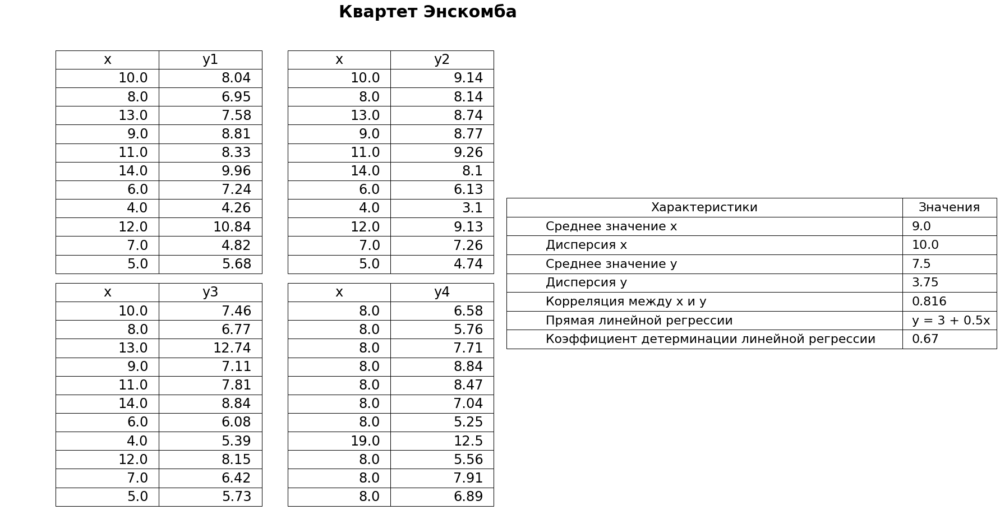

In [2]:
def set_table(table):
    table.auto_set_font_size(False)
    table.set_fontsize(24)
    

x = np.array([10, 8, 13, 9, 11, 14, 6, 4, 12, 7, 5])
y1 = np.array([8.04, 6.95, 7.58, 8.81, 8.33, 9.96, 7.24, 4.26, 10.84, 4.82, 5.68])
y2 = np.array([9.14, 8.14, 8.74, 8.77, 9.26, 8.10, 6.13, 3.10, 9.13, 7.26, 4.74])
y3 = np.array([7.46, 6.77, 12.74, 7.11, 7.81, 8.84, 6.08, 5.39, 8.15, 6.42, 5.73])
x4 = np.array([8, 8, 8, 8, 8, 8, 8, 19, 8, 8, 8])
y4 = np.array([6.58, 5.76, 7.71, 8.84, 8.47, 7.04, 5.25, 12.50, 5.56, 7.91, 6.89])

fig = plt.figure(figsize=(28, 14))
fig.suptitle('Квартет Энскомба', fontsize=30, fontweight='bold')

gs = gridspec.GridSpec(2, 3)
ax1 = plt.subplot(gs[0, 0])
ax2 = plt.subplot(gs[0, 1])
ax3 = plt.subplot(gs[1, 0])
ax4 = plt.subplot(gs[1, 1])
ax5 = plt.subplot(gs[:, 2])


df = pd.DataFrame({'x': x, 'y1': y1})
table = ax1.table(cellText=df.values, colLabels=df.columns, bbox = [0.2, -0.1, 0.8, 1.15], colWidths=[0.1] * 3)
set_table(table)

df = pd.DataFrame({'x': x, 'y2': y2})
table = ax2.table(cellText=df.values, colLabels=df.columns, bbox = [-0.1, -0.1, 0.8, 1.15], colWidths=[0.1] * 3)
set_table(table)

df = pd.DataFrame({'x': x, 'y3': y3})
table = ax3.table(cellText=df.values, colLabels=df.columns, bbox = [0.2, -0.1, 0.8, 1.15], colWidths=[0.1] * 3)
set_table(table)
    
df = pd.DataFrame({'x': x4, 'y4': y4})
table = ax4.table(cellText=df.values, colLabels=df.columns, bbox = [-0.1, -0.1, 0.8, 1.15], colWidths=[0.1] * 3)
set_table(table)

values = ['Среднее значение x', 
          'Дисперсия x', 
          'Среднее значение y', 
          'Дисперсия y', 
          'Корреляция между x и y', 
          'Прямая линейной регрессии', 
          'Коэффициент детерминации линейной регрессии']

df = pd.DataFrame({'Характеристики': values, 'Значения': [9.0, 10.0, 7.5, 3.75, 0.816, 'y = 3 + 0.5x', 0.67]})
table = ax5.table(cellText=df.values, colLabels=df.columns, loc='center', cellLoc='left')
table.auto_set_font_size(False)
table.set_fontsize(22)
table.scale(1,  2.8)
table.auto_set_column_width(col=list(range(len(df.columns))))

for ax in [ax1, ax2, ax3, ax4, ax5]:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    [spine.set_visible(False) for spine in ax.spines.values()]

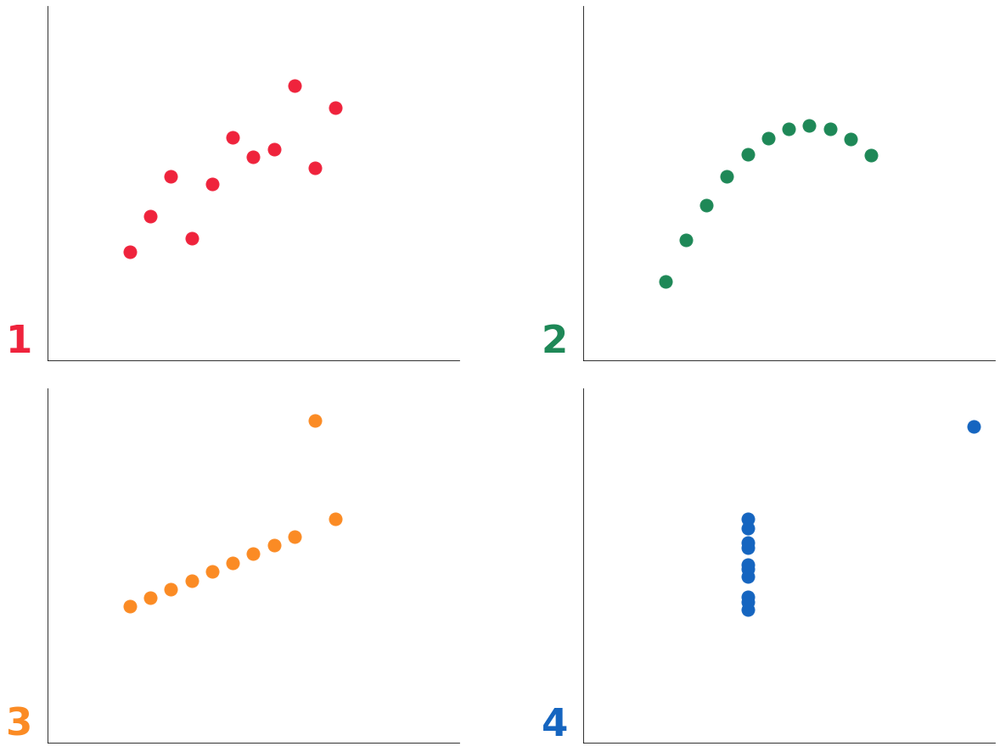

In [3]:
def set_plot(ax, x, y, color, number):
    ax.set(xlim=(0, 20), ylim=(0, 14))
    ax.plot(x, y, 'o', color=color, markersize=15)
    ax.set(xticks=(), yticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.text(-0.1, 0, number, fontsize=45, transform=ax.transAxes, va='bottom', color=color, fontweight='bold')

fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(20, 16), gridspec_kw={'wspace': 0.3, 'hspace': 0.08})

for ax, x1, y, color, number in zip(axes.flat, [x, x, x, x4], [y1, y2, y3, y4], ['#EF233C', '#1E8857', '#FB8B24', '#1565C0'], [1, 2, 3, 4]):
    set_plot(ax, x1, y, color, number)
    
plt.show()

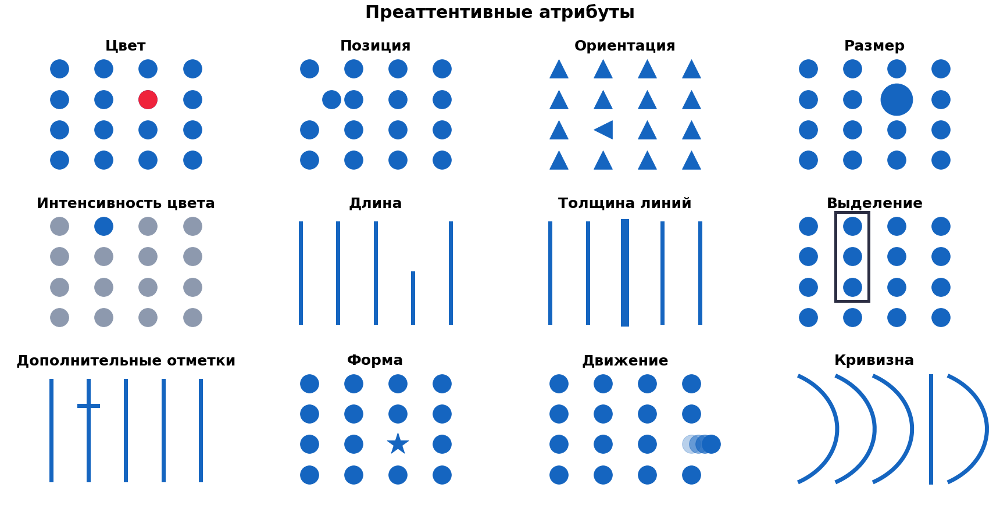

In [4]:
fig, axes = plt.subplots(3, 4, figsize=(24, 12))
fig.suptitle('Преаттентивные атрибуты', fontsize=30, fontweight='bold', y=1.01)

x1 = [1, 2, 3, 4, 1, 2, 3, 4, 1, 2, 3, 4, 1, 2, 3, 4]
y1 = [1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4]

axes[0][0].scatter(x1, y1, 1000, color='#1565C0')
axes[0][0].scatter(3, 3, 1000, color='#EF233C')
axes[0][0].set_xlim((-0.25, 5.25))
axes[0][0].set_ylim((0, 4.5))

axes[0][1].scatter(x1[:8], y1[:8], 1000, color='#1565C0')
axes[0][1].scatter(x1[9:], y1[9:], 1000, color='#1565C0')
axes[0][1].scatter(1.5, 3, 1000, color='#1565C0')
axes[0][1].set_xlim((-0.25, 5.25))
axes[0][1].set_ylim((0, 4.5))

axes[0][2].scatter(x1[:5], y1[:5], 1000, color='#1565C0', marker='^')
axes[0][2].scatter(x1[6:], y1[6:], 1000, color='#1565C0', marker='^')
axes[0][2].scatter(2, 2, 1000, color='#1565C0', marker='<')
axes[0][2].set_xlim((-0.25, 5.25))
axes[0][2].set_ylim((0, 4.5))

axes[0][3].scatter(x1, y1, 1000, color='#1565C0')
axes[0][3].scatter(3, 3, 3000, color='#1565C0')
axes[0][3].set_xlim((-0.25, 5.25))
axes[0][3].set_ylim((0, 4.5))

axes[1][0].scatter(x1[:13], y1[:13], 1000, color='#8D99AE')
axes[1][0].scatter(x1[14:], y1[14:], 1000, color='#8D99AE')
axes[1][0].scatter(2, 4, 1000, color='#1565C0')
axes[1][0].set_xlim((-0.25, 5.25))
axes[1][0].set_ylim((0, 4.5))

axes[1][1].plot([1, 1], [1, 5], color='#1565C0', linewidth=7)
axes[1][1].plot([2, 2], [1, 5], color='#1565C0', linewidth=7)
axes[1][1].plot([3, 3], [1, 5], color='#1565C0', linewidth=7)
axes[1][1].plot([4, 4], [1, 3], color='#1565C0', linewidth=7)
axes[1][1].plot([5, 5], [1, 5], color='#1565C0', linewidth=7)
axes[1][1].set_xlim((-0.25, 6.25))
axes[1][1].set_ylim((0, 5.5))

axes[1][2].plot([1, 1], [1, 5], color='#1565C0', linewidth=7)
axes[1][2].plot([2, 2], [1, 5], color='#1565C0', linewidth=7)
axes[1][2].plot([3, 3], [1, 5], color='#1565C0', linewidth=14)
axes[1][2].plot([4, 4], [1, 5], color='#1565C0', linewidth=7)
axes[1][2].plot([5, 5], [1, 5], color='#1565C0', linewidth=7)
axes[1][2].set_xlim((-0.25, 6.25))
axes[1][2].set_ylim((0, 5.5))

axes[1][3].scatter(x1, y1, 1000, color='#1565C0')
axes[1][3].set_xlim((-0.25, 5.25))
axes[1][3].set_ylim((0, 4.5))
rect2 = Rectangle((1.62, 1.53), 0.75, 2.93, fc='#ffffff', alpha=1, ec='#2B2D42', lw=5, zorder=0)
axes[1][3].add_patch(rect2)

axes[2][0].plot([1, 1], [1, 5], color='#1565C0', linewidth=7)
axes[2][0].plot([2, 2], [1, 5], color='#1565C0', linewidth=7)
axes[2][0].plot([3, 3], [1, 5], color='#1565C0', linewidth=7)
axes[2][0].plot([4, 4], [1, 5], color='#1565C0', linewidth=7)
axes[2][0].plot([5, 5], [1, 5], color='#1565C0', linewidth=7)
axes[2][0].plot([1.75, 2.25], [4, 4], color='#1565C0', linewidth=7)
axes[2][0].set_xlim((-0.25, 6.25))
axes[2][0].set_ylim((0, 5.5))

axes[2][1].scatter(x1[:6], y1[:6], 1000, color='#1565C0')
axes[2][1].scatter(x1[7:], y1[7:], 1000, color='#1565C0')
axes[2][1].scatter(3, 2, 1500, color='#1565C0', marker='*', zorder=5)
axes[2][1].set_xlim((-0.25, 5.25))
axes[2][1].set_ylim((0, 4.5))

axes[2][2].scatter(x1[:7], y1[:7], 1000, color='#1565C0')
axes[2][2].scatter(x1[8:], y1[8:], 1000, color='#1565C0')
axes[2][2].scatter(4, 2, 1000, color='#1565C0', alpha=0.3, zorder=5)
axes[2][2].scatter(4.15, 2, 1000, color='#1565C0', alpha=0.5, zorder=5)
axes[2][2].scatter(4.30, 2, 1000, color='#1565C0', alpha=0.7, zorder=5)
axes[2][2].scatter(4.45, 2, 1000, color='#1565C0', alpha=1, zorder=5)
axes[2][2].set_xlim((-0.25, 5.25))
axes[2][2].set_ylim((0, 4.5))

def generate_curve(center_x=1, radius=2, center_y=3, stepsize=0.001, shift=0):       
    x = np.arange(center_x, radius, stepsize)
    y = np.sqrt(radius**2 - x**2)
    x = np.concatenate([x,x[::-1]])
    y = np.concatenate([y,-y[::-1]])
    return x+shift, y + center_y

for i in [0, 1, 2, 4]:
    x, y = generate_curve(shift=i)
    axes[2][3].plot(x, y, linewidth=7, color='#1565C0')

axes[2][3].plot([4.5, 4.5], [1.25, 4.75], color='#1565C0', linewidth=7)
axes[2][3].set_xlim((-0.25, 6.25))
axes[2][3].set_ylim((0.5, 5))
    
titles = ['Цвет', 'Позиция', 'Ориентация','Размер', 'Интенсивность цвета', 'Длина',
          'Толщина линий', 'Выделение', 'Дополнительные отметки', 'Форма', 'Движение', 'Кривизна']

for ax, title in zip(axes.flat, titles):
    ax.set_title(title, fontsize=25, fontweight='bold')
    ax.set(xticks=(), yticks=())
    [i.set_visible(False) for i in ax.spines.values()]

plt.tight_layout()
plt.show()

<div style='display: block; width: 75%; margin: 0 auto;'>
    <img src='http://3.bp.blogspot.com/-B69qHmCFkLk/UhTnFBv_51I/AAAAAAAAB0w/2euez7diSJk/s1600/images.jpg', style='margin-left: 250px;'>
    <br>
    <span style='display: block; margin: 0 auto; text-align: center; font-size: 20px;'><i>Source: </i><a src='http://www.thefunctionalart.com/2013/08/in-infographics-steal-what-you-need-but.html'>The Functional Art</a></span>
</div>

<div style='display: block; width: 75%; margin: 0 auto;'>
    <img src='https://dev.by/ckeditor_assets/pictures/261/content_screen_shot_2013-01-30_at_5_00_56_pm.png', style='margin-left: 100px; height: 500px;'>
    <br>
    <span style='display: block; margin: 0 auto; text-align: center; font-size: 20px;'><i>Source: </i><a src='https://dev.by/news/o-vizualizatsii-dannyh-prodolzhenie'>dev.by</a></span>
</div>

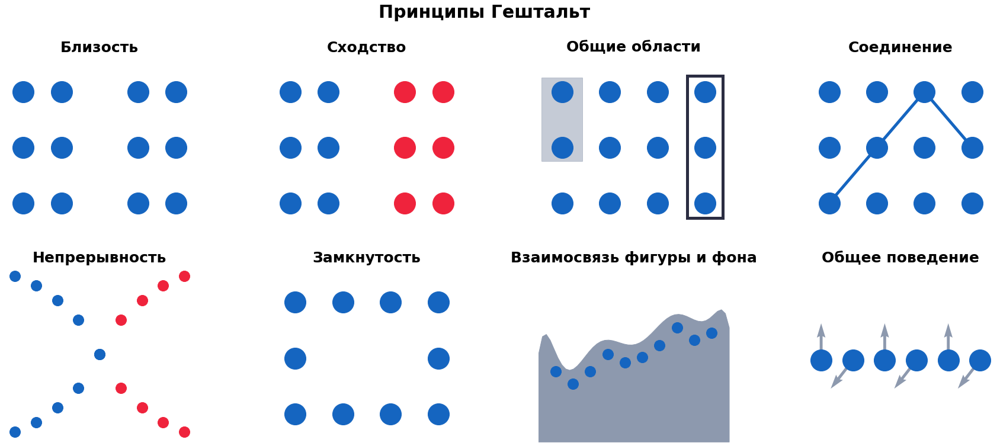

In [8]:
fig, axes = plt.subplots(2, 4, figsize=(30, 12), gridspec_kw={'wspace': 0.4, 'hspace': 0.2})
fig.suptitle('Принципы Гештальт', fontsize=30, fontweight='bold')

for ax in axes.flat:
    ax.set(xticks=(), yticks=())
    [s.set_visible(False) for s in ax.spines.values()]
    
    
# proximity
x = [1, 2, 4, 5, 1, 2, 4, 5, 1, 2, 4, 5]
y = [1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3]
axes[0, 0].plot(x, y, 'o', color='#1565C0', markersize=36)


# similarity
x = [1, 2, 1, 2, 1, 2]
y = [1, 1, 2, 2, 3, 3]
axes[0, 1].plot(x, y, 'o', color='#1565C0', markersize=36)

x = [4, 5, 4, 5, 4, 5]
axes[0, 1].plot(x, y, 'o', color='#EF233C', markersize=36)


# enclosure
x = [1, 2, 3, 4, 1, 2, 3, 4, 1, 2, 3, 4]
y = [1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3]
axes[0, 2].plot(x, y, 'o', color='#1565C0', markersize=36)

rect1 = Rectangle((0.57, 1.75), 0.85, 1.5, color='#8D99AE', alpha=0.5)
axes[0, 2].add_patch(rect1)

rect2 = Rectangle((3.62, 0.73), 0.75, 2.55, fc='#ffffff', alpha=1, ec='#2B2D42', lw=5)
axes[0, 2].add_patch(rect2)


# connection
axes[0, 3].plot(x, y, 'o', color='#1565C0', markersize=36)
axes[0, 3].plot([1, 2, 3, 4], [1, 2, 3, 2], linewidth=5, color='#1565C0')


# continuity
x = [1, 2, 3, 4, 5, 1, 2, 3, 4, 5]
y = [9, 8.5, 7.75, 6.75, 5, 1, 1.5, 2.25, 3.25, 5]
axes[1, 0].plot(x, y, 'o', markersize=18, color='#1565C0')

x = [6, 7, 8, 9, 6, 7, 8, 9]
y = [3.25, 2.25, 1.5, 1, 6.75, 7.75, 8.5, 9]
axes[1, 0].plot(x, y, 'o', markersize=18, color='#EF233C')


# closure
x = [1, 2, 3, 4, 1, 4, 1, 2, 3, 4]
y = [1, 1, 1, 1, 2, 2, 3, 3, 3, 3]
axes[1, 1].plot(x, y, 'o', markersize=36, color='#1565C0')


# figure-ground
x = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
y = np.array([50, 50, 43, 50, 60, 55, 58, 65, 75, 68, 72, 65])
axes[1, 2].plot(x[1:-1], y[1:-1]-10, 'o', markersize=18, color='#1565C0')

model = np.poly1d(np.polyfit(x, y, 8))
polyline = np.linspace(0, 11, 50)
axes[1, 2].fill_between(polyline, model(polyline), color='#8D99AE')


# common fate
x = [1, 2, 3, 4, 5, 6]
y = [1.5, 1.5, 1.5, 1.5, 1.5, 1.5]
axes[1, 3].plot(x, y, 'o', color='#1565C0', markersize=36)
axes[1, 3].quiver([1, 2, 3, 4, 5, 6], [1.5, 1.5, 1.5, 1.5, 1.5, 1.5], [0, -0.7, 0, -0.7, 0, -0.7], 
                  [0.45, -0.35, 0.45, -0.35, 0.45, -0.35], angles='xy', scale_units='xy', scale=1, color='#8D99AE', width=0.015)

# lims
axes[0, 0].set(xlim=(0.5, 5.5), ylim=(0.5, 3.65))
axes[0, 1].set(xlim=(0.5, 5.5), ylim=(0.5, 3.65))
axes[0, 2].set(xlim=(0.5, 4.5), ylim=(0.5, 3.65))
axes[0, 3].set(xlim=(0.5, 4.5), ylim=(0.5, 3.65))
axes[1, 0].set(xlim=(0.5, 9.5), ylim=(0.5, 9.5))
axes[1, 1].set(xlim=(0.5, 4.5), ylim=(0.5, 3.65))
axes[1, 2].set(xlim=(0, 11), ylim=(0, 100))
axes[1, 3].set(xlim=(0.5, 6.5), ylim=(0.5, 2.65))


# titles
axes[0, 0].set_title('Близость', fontsize=25, fontweight='bold')
axes[0, 1].set_title('Сходство', fontsize=25, fontweight='bold')
axes[0, 2].set_title('Общие области', fontsize=25, fontweight='bold')
axes[0, 3].set_title('Соединение', fontsize=25, fontweight='bold')
axes[1, 0].set_title('Непрерывность', fontsize=25, fontweight='bold')
axes[1, 1].set_title('Замкнутость', fontsize=25, fontweight='bold')
axes[1, 2].set_title('Взаимосвязь фигуры и фона', fontsize=25, fontweight='bold')
axes[1, 3].set_title('Общее поведение', fontsize=25, fontweight='bold')

plt.show()

<div style='font-weight: 700; font-size: 50px; text-align: center;'>Выбор правильной визуализации</div>

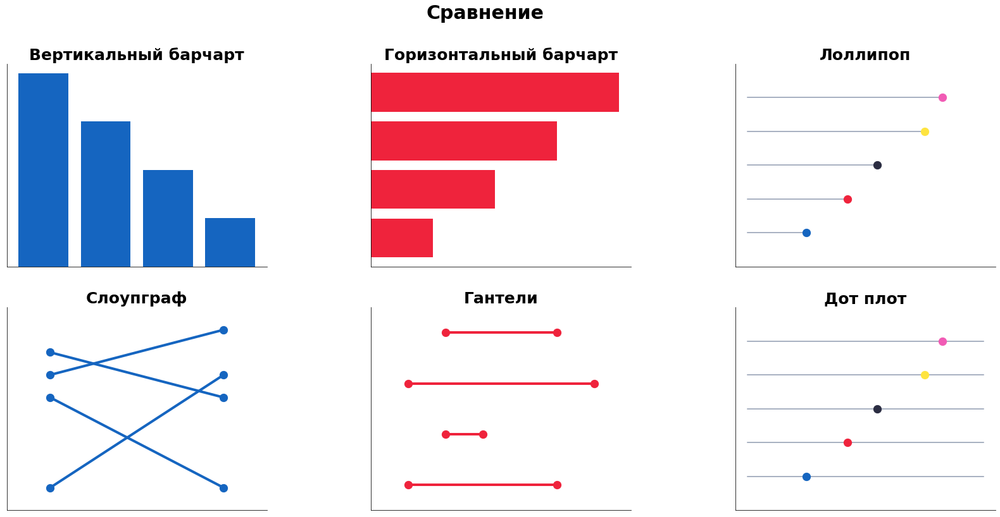

In [13]:
fig, axes = plt.subplots(2, 3, figsize=(28, 13), gridspec_kw={'wspace': 0.4, 'hspace': 0.2})
fig.suptitle('Сравнение', fontsize=30, fontweight='bold')

x = np.arange(1, 5)
y = np.arange(1, 5)

axes[0][0].set_title('Вертикальный барчарт', fontsize=25, fontweight='bold')
axes[0][1].set_title('Горизонтальный барчарт', fontsize=25, fontweight='bold')
axes[1][0].set_title('Слоупграф', fontsize=25, fontweight='bold')
axes[1][1].set_title('Гантели', fontsize=25, fontweight='bold')
axes[0][2].set_title('Лоллипоп', fontsize=25, fontweight='bold')
axes[1][2].set_title('Дот плот', fontsize=25, fontweight='bold')

axes[0][0].bar(x, sorted(y, reverse=True), color='#1565C0')
axes[0][1].barh(x, y, color='#EF233C')

axes[1][0].plot([0,1], [-1, 4], linewidth=4, color='#1565C0')
axes[1][0].plot([0,1], [3, -1], linewidth=4, color='#1565C0')
axes[1][0].plot([0,1], [4, 6], linewidth=4, color='#1565C0')
axes[1][0].plot([0,1], [5, 3], linewidth=4, color='#1565C0')
axes[1][0].scatter([0,1], [-1, 4], 150, color='#1565C0')
axes[1][0].scatter([0,1], [3, -1], 150, color='#1565C0')
axes[1][0].scatter([0,1], [4, 6], 150, color='#1565C0')
axes[1][0].scatter([0,1], [5, 3], 150, color='#1565C0')
axes[1][0].set_xlim((-0.25, 1.25))
axes[1][0].set_ylim((-2, 7))

axes[1][1].plot([1, 5], [1, 1], linewidth=4, color='#EF233C')
axes[1][1].plot([2, 3], [2, 2], linewidth=4, color='#EF233C')
axes[1][1].plot([1, 6], [3, 3], linewidth=4, color='#EF233C')
axes[1][1].plot([2, 5], [4, 4], linewidth=4, color='#EF233C')
axes[1][1].scatter([1, 5, 2, 3, 1, 6, 2, 5], [1, 1, 2, 2, 3, 3, 4, 4], 150, color='#EF233C')
axes[1][1].set_xlim((0, 7))
axes[1][1].set_ylim((0.5, 4.5))


axes[0][2].plot([1, 2], [0, 0], color='#8D99AE')
axes[0][2].plot([1, 2.7], [1, 1], color='#8D99AE')
axes[0][2].plot([1, 3.2], [2, 2], color='#8D99AE')
axes[0][2].plot([1, 4], [3, 3], color='#8D99AE')
axes[0][2].plot([1, 4.3], [4, 4], color='#8D99AE')
axes[0][2].scatter(2, 0, 150, zorder=5, color='#1565C0')
axes[0][2].scatter(2.7, 1, 150, zorder=5, color='#EF233C')
axes[0][2].scatter(3.2, 2, 150, zorder=5, color='#2B2D42')
axes[0][2].scatter(4, 3, 150, zorder=5, color='#FEE440')
axes[0][2].scatter(4.3, 4, 150, zorder=5, color='#F15BB5')
axes[0][2].set_xlim((0.8, 5.2))
axes[0][2].set_ylim((-1, 5))


for i in range(0, 5):
    axes[1][2].plot([1, 5], [i, i], color='#8D99AE')
    
axes[1][2].scatter(2, 0, 150, zorder=5, color='#1565C0')
axes[1][2].scatter(2.7, 1, 150, zorder=5, color='#EF233C')
axes[1][2].scatter(3.2, 2, 150, zorder=5, color='#2B2D42')
axes[1][2].scatter(4, 3, 150, zorder=5, color='#FEE440')
axes[1][2].scatter(4.3, 4, 150, zorder=5, color='#F15BB5')

axes[1][2].set_ylim((-1, 5))


for ax in axes.flat:
    ax.set(xticks=(), yticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

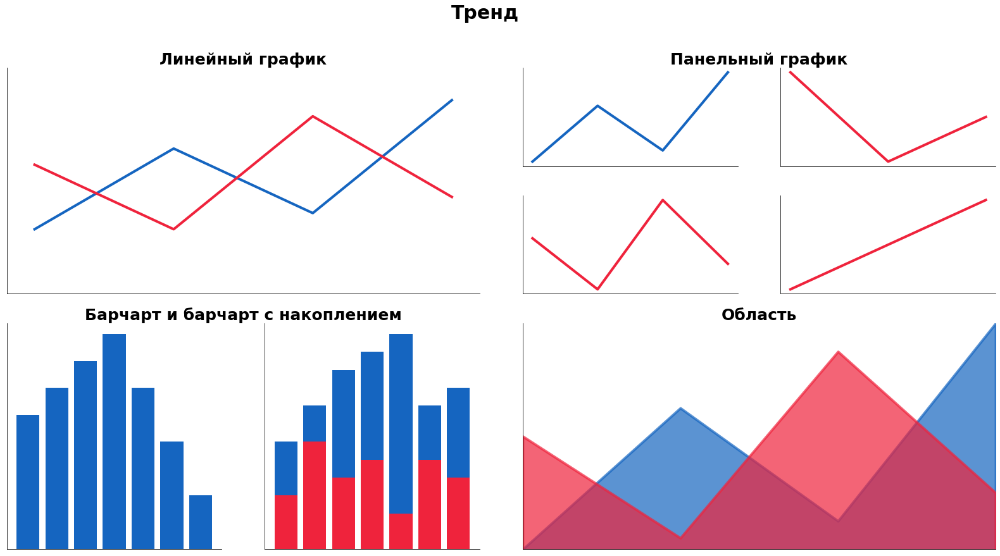

In [14]:
fig = plt.figure(figsize=(28, 14))
fig.suptitle('Тренд', fontsize=30, fontweight='bold')

gs = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.2)
ax1 = plt.subplot(gs[:2, :2])
ax2_1 = plt.subplot(gs[0, 2:3])
ax2_2 = plt.subplot(gs[0, 3:])
ax2_3 = plt.subplot(gs[1, 2:3])
ax2_4 = plt.subplot(gs[1, 3:])
ax3_1 = plt.subplot(gs[2:, :1])
ax3_2 = plt.subplot(gs[2:, 1:2])
ax4 = plt.subplot(gs[2:, 2:])

ax1.plot([1, 2, 3, 4], [1, 3.5, 1.5, 5], linewidth=4, color='#1565C0')
ax1.plot([1, 2, 3, 4], [3, 1, 4.5, 2], linewidth=4, color='#EF233C')
ax1.set_ylim((-1, 6))
ax1.set_xlim((0.8, 4.2))

ax2_1.plot([1, 2, 3, 4], [1, 3.5, 1.5, 5], linewidth=4, color='#1565C0')
ax2_2.plot([1, 2, 3], [3, 1, 2], linewidth=4, color='#EF233C')
ax2_3.plot([1, 2, 3, 4], [3, 1, 4.5, 2], linewidth=4, color='#EF233C')
ax2_4.plot([1, 2, 3], [1, 2, 3], linewidth=4, color='#EF233C')

ax3_1.bar([1, 2, 3, 4, 5, 6, 7], [5, 6, 7, 8, 6, 4, 2], color='#1565C0')
ax3_2.bar([1, 2, 3, 4, 5, 6, 7], [6, 8, 10, 11, 12, 8, 9], color='#1565C0')
ax3_2.bar([1, 2, 3, 4, 5, 6, 7], [3, 6, 4, 5, 2, 5, 4], color='#EF233C')

ax4.fill_between([1, 2, 3, 4], [1, 3.5, 1.5, 5], linewidth=4, color='#1565C0', alpha=0.7)
ax4.fill_between([1, 2, 3, 4], [3, 1.2, 4.5, 2], linewidth=4, color='#EF233C', alpha=0.7)
ax4.set_xlim((1, 4))
ax4.set_ylim((1, 5))

ax1.set_title('Линейный график', fontsize=25, fontweight='bold')
ax2_1.set_title('Панельный график', fontsize=25, fontweight='bold', x=1.1)
ax3_1.set_title('Барчарт и барчарт с накоплением', fontsize=25, fontweight='bold', x=1.1)
ax4.set_title('Область', fontsize=25, fontweight='bold')

for ax in [ax1, ax2_1, ax2_2, ax2_3, ax2_4, ax3_1, ax3_2, ax4]:
    ax.set(xticks=(), yticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

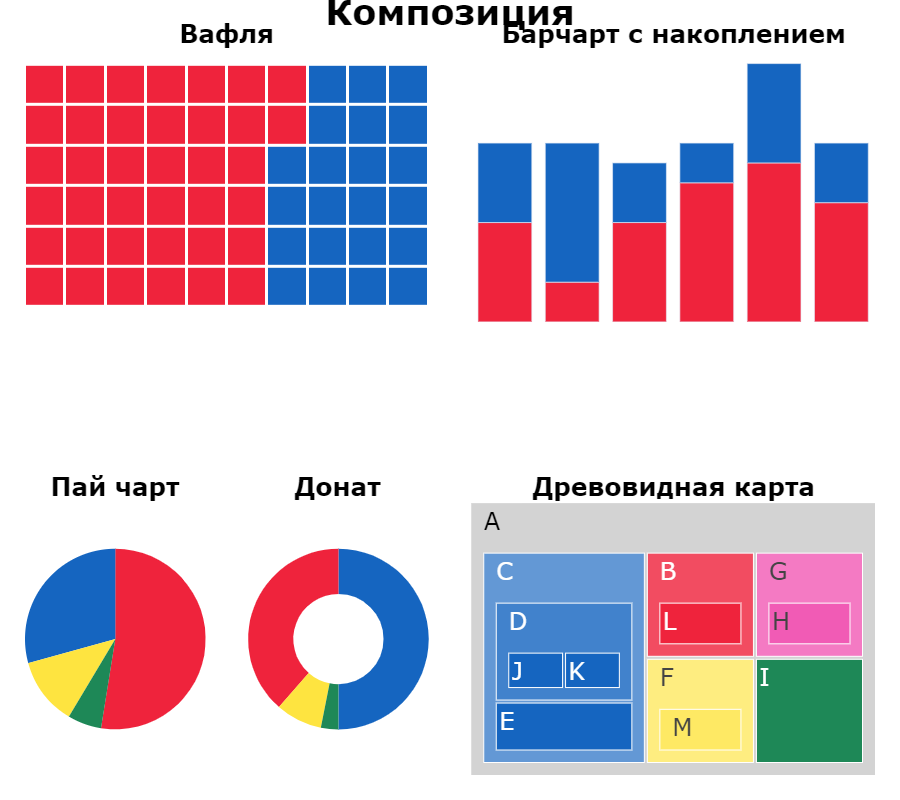

In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

rows = 2
cols = 4
fig = make_subplots(
    rows=rows, cols=cols,
    specs = [[{"type": "heatmap", 'colspan': 2}, None, {"type": "bar", 'colspan': 2}, None],
            [{'type': 'pie'}, {'type': 'pie'}, {'type': 'treemap', 'colspan': 2}, None]],
    subplot_titles = ['<b>Вафля</b>', '<b>Барчарт с накоплением</b>', '<b>Пай чарт</b>', '<b>Донат</b>', '<b>Древовидная карта</b>', None],
    #horizontal_spacing = 0.01,
    #vertical_spacing = 0.1,
)

# waffle
m= 6
n= 10
z = np.ones((m, n))
z[2:, 6] = 2
z[:, 7:] = 2

d = {1: "1",
    2: "2",
    3: "3",}
M = max([len(s) for s in d.values()])
customdata= np.empty((m,n), dtype=f'<U{M}') 

for i in range(m):
    for j in range(n):           
        customdata[i,j] = d[z[i, j]] 

colorscale = [[0, "#EF233C"],
              [0.33, "#EF233C"],
              [0.33, "#1565C0"],
              [0.66,  "#1565C0"],
              [0.66, "#1565C0" ],
              [1, "#1565C0"]]

fig.add_trace(go.Heatmap(z=z, customdata=customdata, xgap=3, ygap=3,
                           colorscale=colorscale, showscale=False, ),
              row=1, col=1)


# stacked columns
x = [1, 2, 3, 4, 5, 6]
fig.add_trace(go.Bar(x=x,y=[5,2,5,7,8,6], marker_color='#EF233C'),
             row=1, col=3)
fig.add_trace(go.Bar(x=x,y=[4,7,3,2,5,3], marker_color='#1565C0'),
             row=1, col=3)


colors=['#EF233C', '#1565C0', '#FEE440', '#1E8857']
# pie and donut
values = [52, 29, 12, 6]
fig.add_trace(go.Pie(values=values, marker={'colors':colors}, showlegend=False, textinfo='none', domain={'x': [0.5, 1], 'y': [0.5, 1]}), row=2, col=1)

values = [37, 48, 8, 3]
fig.add_trace(go.Pie(values=values, marker={'colors':colors}, hole=.5, showlegend=False, textinfo='none', domain={'x': [0, 0.5], 'y': [0, 0.5]}), row=2, col=2)

# treemap
fig.add_trace(go.Treemap(
    labels = ["A","B", "C", "D", "E", "F", "G", "H", "I", "J", "K", "L", "M", "N"],
    parents = ["", "A", "A", "C", "C", "A", "A", "G", "A", "D", "D", "B", "F", "M"],
    root_color="lightgrey", textinfo=None, 
    pathbar_textfont_size=1,
), row=2, col=3)

fig.update_layout(width=1700, 
                  height=800, 
                  margin = dict(t=50, l=25, r=25, b=25),
                  yaxis_autorange='reversed', 
                  xaxis={'showticklabels':False, 'showline': False}, 
                  yaxis={'showticklabels':False, 'showline': False}, 
                  yaxis_visible=False, yaxis_showticklabels=False,
                  autosize=False,
                  treemapcolorway = ["#1565C0", "#EF233C", '#FEE440', '#F15BB5', '#1E8857'],
                  plot_bgcolor='rgba(0,0,0,0)',
                  title = {'text':'<b>Композиция</b>',
                           'x':0.5,},
                  font_color='black',
                  uniformtext=dict(minsize=0, mode='hide'),
                  font_size=25,
)

fig.update_layout(barmode="relative", showlegend=False)
fig.update_layout(yaxis = dict(scaleanchor = 'x'))
fig.update_yaxes(visible=False, showticklabels=False)
fig.update_xaxes(visible=False, showticklabels=False)
fig.update_annotations(font_size=25)

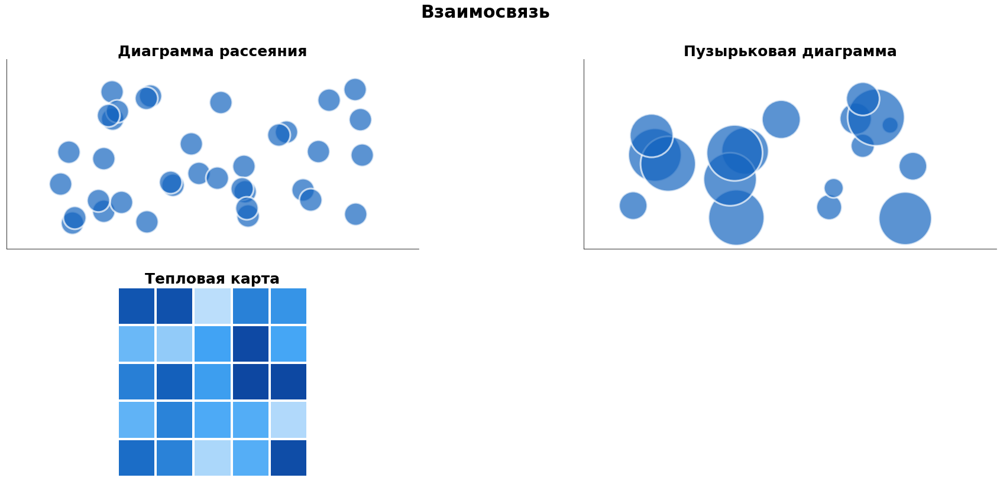

In [16]:
fig, axes = plt.subplots(2, 2, figsize=(30, 13), gridspec_kw={'wspace': 0.4, 'hspace': 0.2})
fig.suptitle('Взаимосвязь', fontsize=30, fontweight='bold')
np.random.seed(42)

x = np.random.rand(36)
y = np.random.rand(36)
sns.scatterplot(x=x, y=y, alpha = 0.7, s = 1500, ax=axes[0][0], color='#1565C0')
axes[0][0].set_xlim((-0.15, 1.15))
axes[0][0].set_ylim((-0.15, 1.2))
axes[0][0].set_title('Диаграмма рассеяния', fontsize=25, fontweight='bold')

x = np.random.rand(18)
y = np.random.rand(18)
size = np.random.rand(18)*10000
sns.scatterplot(x=x, y=y, alpha = 0.7, s = size, ax=axes[0][1], color='#1565C0')
axes[0][1].set_xlim((-0.15, 1.15))
axes[0][1].set_ylim((-0.2, 1.2))
axes[0][1].set_title('Пузырьковая диаграмма', fontsize=25, fontweight='bold')

colors = ["#BBDEFB", "#42A5F5", "#1565C0", "#0D47A1"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
rand = np.random.rand(5, 5)
sns.heatmap(rand, ax=axes[1][0], square=True, cbar=False, linewidths=3, cmap=cmap)
axes[1][0].set_title('Тепловая карта', fontsize=25, fontweight='bold')

for ax in axes.flat:
    ax.set(xticks=(), yticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)    
    
axes[1][1].spines['bottom'].set_visible(False)    
axes[1][1].spines['left'].set_visible(False)    

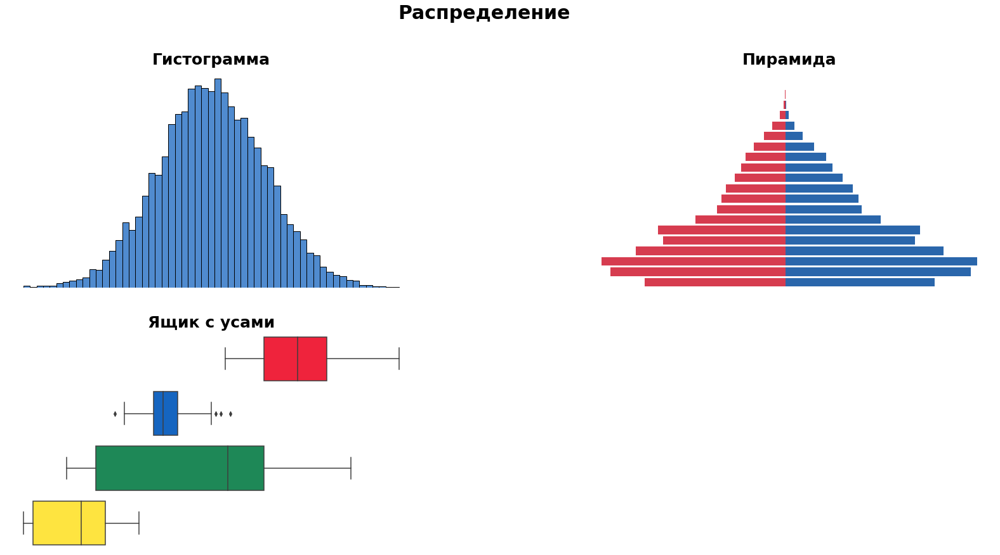

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(28, 14), gridspec_kw={'wspace': 0.4, 'hspace': 0.2})
fig.suptitle('Распределение', fontsize=30, fontweight='bold')


# histplot    
sns.histplot(np.random.randn(10000), ax=axes[0, 0], color='#1565C0')
    
# pyramid
df = pd.DataFrame({'Age': ['0-4','5-9','10-14','15-19','20-24','25-29','30-34','35-39','40-44','45-49','50-54','55-59','60-64','65-69','70-74','75-79','80-84','85-89','90-94','95-99','100+'], 
                    'Male': [-49228000, -61283000, -64391000, -52437000, -42955000, -44667000, -31570000, -23887000, -22390000, -20971000, -17685000, -15450000, -13932000, -11020000, -7611000, -4653000, -1952000, -625000, -116000, -14000, -1000], 
                    'Female': [52367000, 64959000, 67161000, 55388000, 45448000, 47129000, 33436000, 26710000, 25627000, 23612000, 20075000, 16368000, 14220000, 10125000, 5984000, 3131000, 1151000, 312000, 49000, 4000, 0]})
AgeClass = ['100+','95-99','90-94','85-89','80-84','75-79','70-74','65-69','60-64','55-59','50-54','45-49','40-44','35-39','30-34','25-29','20-24','15-19','10-14','5-9','0-4']
colors = [plt.cm.Spectral(i) for i in range(3)]

sns.barplot(x='Male', y='Age', data=df, order=AgeClass, lw=0, color='#EF233C', ax=axes[0, 1])
sns.barplot(x='Female', y='Age', data=df, order=AgeClass, lw=0, color='#1565C0', ax=axes[0, 1])

#box plot
iris = sns.load_dataset("iris")
boxplot = sns.boxplot(data=iris, orient="h", ax=axes[1, 0])
colors=['#EF233C', '#1565C0', '#1E8857', '#FEE440']
[boxplot.artists[i].set_facecolor(colors[i]) for i in range(0, 4)]


axes[0, 0].set_title('Гистограмма', fontsize=25, fontweight='bold')
axes[0, 1].set_title('Пирамида', fontsize=25, fontweight='bold')
axes[1, 0].set_title('Ящик с усами', fontsize=25, fontweight='bold')

for ax in axes.flat:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    [s.set_visible(False) for s in ax.spines.values()]

plt.show()

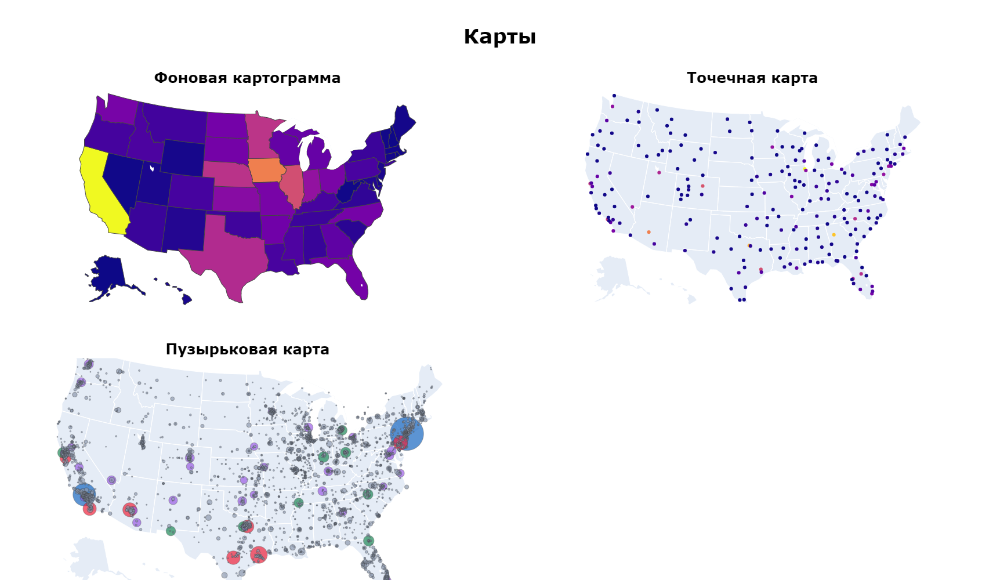

In [18]:
rows = 2
cols = 2
fig = make_subplots(
    rows=rows, cols=cols,
    specs = [[{'type': 'choropleth'} for c in np.arange(cols)] for r in np.arange(rows)],
    subplot_titles = ['<b>Фоновая картограмма</b>','<b>Точечная карта</b>','<b>Пузырьковая карта</b>'],
    horizontal_spacing = 0.01,
    vertical_spacing = 0.1,
)


# chorolpleth
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_us_ag_exports.csv')
    
fig.add_trace(
    go.Choropleth(
        locations=df['code'],
        z = df['total exports'].astype(float), 
        locationmode = 'USA-states',
        geo='geo',
        colorscale = None,
        colorbar=None,
        showlegend = None,
        showscale=False,
    ),
    row=1,
    col=1,
)


# dot density
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')
df['text'] = df['airport'] + '' + df['city'] + ', ' + df['state'] + '' + 'Arrivals: ' + df['cnt'].astype(str)

fig.add_trace(
    go.Scattergeo(
        lon = df['long'],
        lat = df['lat'],
        text = df['text'],
        mode = 'markers',
        marker_color = df['cnt'],
        geo='geo2',
        showlegend = False,
    ),
    row=1,
    col=2,
)

### proportional symbol
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')

df['text'] = df['name'] + '<br>Population ' + (df['pop']/1e6).astype(str)+' million'
limits = [(0,2),(3,10),(11,20),(21,50),(50,3000)]
colors = ["#1565C0","#EF233C","#1E8857","#9B5DE5","#8D99AE"]
cities = []
scale = 5000

for i in range(len(limits)):
    lim = limits[i]
    df_sub = df[lim[0]:lim[1]]
    
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = df_sub['lon'],
        lat = df_sub['lat'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['pop']/scale,
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])),
      row=2, col=1,
     )

fig.update_layout(
    margin=dict(l=0,r=0,b=0,t=150),
    title = {'text':'<b>Карты</b>',
             'x':0.5,
            },
    font_size=25,
    font_color='black',
    showlegend = False,
    height=1000,
    **{'geo' + str(i) + '_scope': 'usa' for i in [''] + np.arange(2,rows*cols+1).tolist()},
    )
fig.update_annotations(font_size=25)
fig.show()

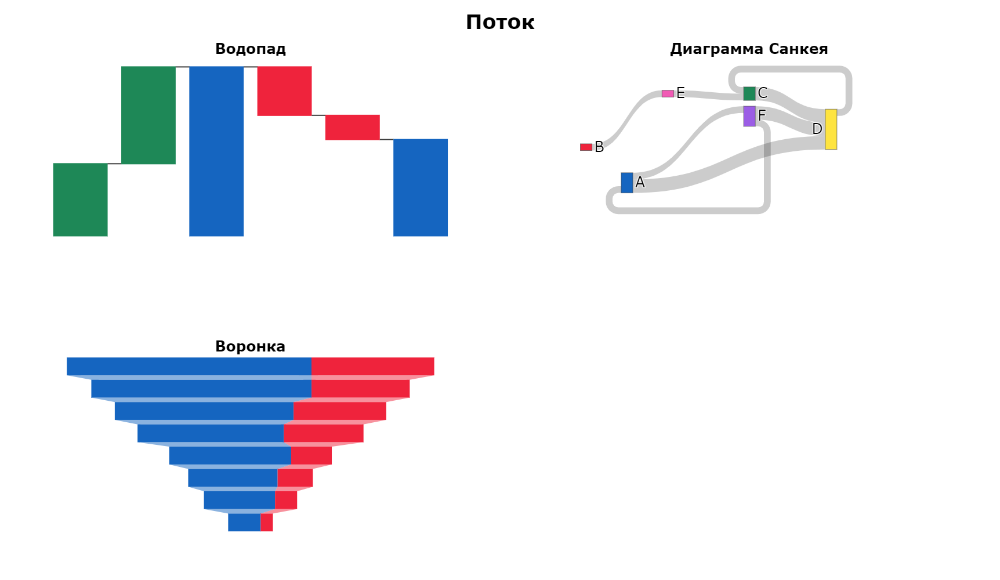

In [19]:
rows = 2
cols = 2
fig = make_subplots(
    rows=rows, cols=cols,
    specs = [[{"type": "waterfall"}, {"type": "sankey"}], [{'type': 'funnel'}, {'type': 'pie'}]],
    subplot_titles = ['<b>Водопад</b>', '<b>Диаграмма Санкея</b>', '<b>Воронка</b>',],
    #horizontal_spacing = 0.01,
    #vertical_spacing = 0.1,
)

fig.add_trace(go.Waterfall(
    name = "20", orientation = "v",
    measure = ["relative", "relative", "total", "relative", "relative", "total"],
    textposition = "outside",
    y = [60, 80, 0, -40, -20, 0],
    connector = {"line":{"color":"rgb(63, 63, 63)"}},
    decreasing = {"marker":{"color":"#EF233C"}},
    increasing = {"marker":{"color":"#1E8857"}},
    totals = {"marker":{"color":"#1565C0"}}
), row=1, col=1)

fig.add_trace(go.Sankey(
    arrangement = "snap",
    node = {
        "label": ["A", "B", "C", "D", "E", "F"],
        "x": [0.2, 0.1, 0.5, 0.7, 0.3, 0.5],
        "y": [0.7, 0.5, 0.2, 0.4, 0.2, 0.3],
        'pad':10,
        'color': ['#1565C0', '#EF233C', '#1E8857', '#FEE440', '#F15BB5', '#9B5DE5']}, 
    link = {
        "source": [0, 0, 1, 2, 5, 4, 3, 5],
        "target": [5, 3, 4, 3, 0, 2, 2, 3],
        "value": [1, 2, 1, 2, 1, 1, 1, 2]},),
    row=1, col=2,
)

stages = ["1", "2", "3", "4", '5', '6', '7', '8']

fig.add_trace(go.Funnel(
    textinfo='none',
    y = stages,
    x = [30100, 27090,  22000, 18000, 15000, 11000, 8750, 4000],
    marker={'color': '#1565C0'}),
    row=2, col=1
)

fig.add_trace(go.Funnel(
    textinfo='none',
    orientation = "h",
    y = stages,
    x = [15100, 12080, 11400, 9800, 5000, 4333, 2718, 1500],
    marker={'color': '#EF233C'}),
    row=2, col=1,
)

fig.update_yaxes(visible=False, showticklabels=False)

fig.update_layout(width=1700, 
                  height=1000, 
                  showlegend = False,
                  xaxis_showgrid=False, 
                  yaxis_showgrid=False,
                  xaxis={'showticklabels':False},
                  yaxis={'showticklabels':False},
                  plot_bgcolor='rgba(0,0,0,0)',
                  title = {'text':'<b>Поток</b>',
                           'x':0.5,
                           },
                  font_size=25,
                  font_color='black',
  )

fig.update_annotations(font_size=25)

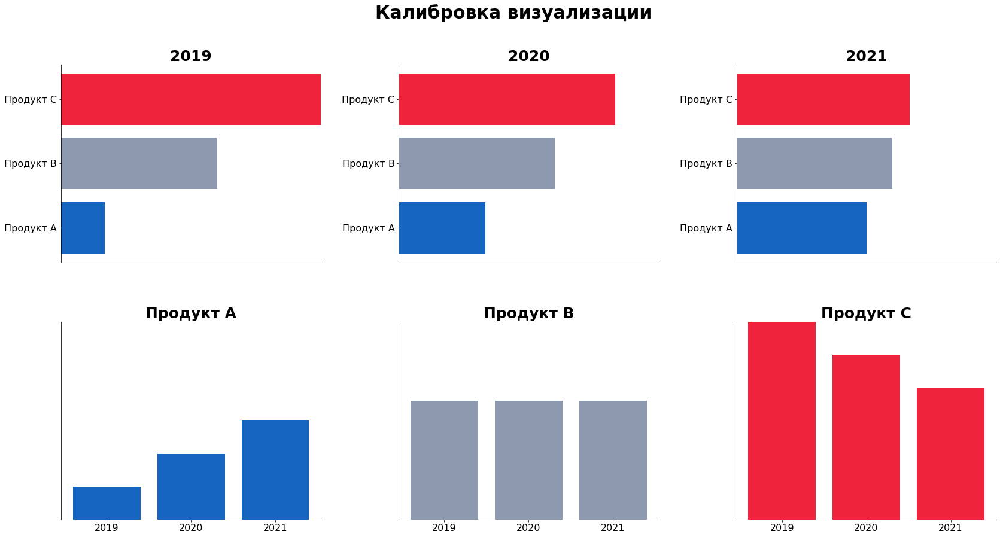

In [20]:
fig, axes = plt.subplots(2, 3, figsize=(28, 14), gridspec_kw={'wspace': 0.3, 'hspace': 0.3})
fig.suptitle('Калибровка визуализации', fontsize=30, fontweight='bold')

x = np.arange(1, 6)
y = np.arange(1, 6)

axes[0][0].barh([1, 2, 3], [5, 18, 30], color=['#1565C0','#8D99AE','#EF233C'])
axes[0][1].barh([1, 2, 3], [10, 18, 25], color=['#1565C0','#8D99AE','#EF233C'])
axes[0][2].barh([1, 2, 3], [15, 18, 20], color=['#1565C0','#8D99AE','#EF233C'])
axes[1][0].bar([1, 2, 3], [5, 10, 15], color='#1565C0')
axes[1][1].bar([1, 2, 3], [18, 18, 18], color='#8D99AE')
axes[1][2].bar([1, 2, 3], [30, 25, 20], color='#EF233C')

axes[0][0].set_title('2019', fontsize=25, fontweight='bold')
axes[0][1].set_title('2020', fontsize=25, fontweight='bold')
axes[0][2].set_title('2021', fontsize=25, fontweight='bold')
axes[1][0].set_title('Продукт A', fontsize=25, fontweight='bold')
axes[1][1].set_title('Продукт B', fontsize=25, fontweight='bold')
axes[1][2].set_title('Продукт C', fontsize=25, fontweight='bold')

axes[0][0].set_xlim(0, 30)
axes[0][1].set_xlim(0, 30)
axes[0][2].set_xlim(0, 30)
axes[1][0].set_ylim(0, 30)
axes[1][1].set_ylim(0, 30)
axes[1][2].set_ylim(0, 30)

for ax in axes.flat[:3]:
    ax.set_yticks((1, 2, 3))
    ax.set_yticklabels(('Продукт A', 'Продукт B', 'Продукт C'), fontsize=16)
    ax.set_xticks(())
    
for ax in axes.flat[3:]:
    ax.set_xticks((1, 2, 3))
    ax.set_xticklabels(('2019', '2020', '2021'), fontsize=16)
    ax.set_yticks(())
    
for ax in axes.flat:
    ax.set(xlabel=None, ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

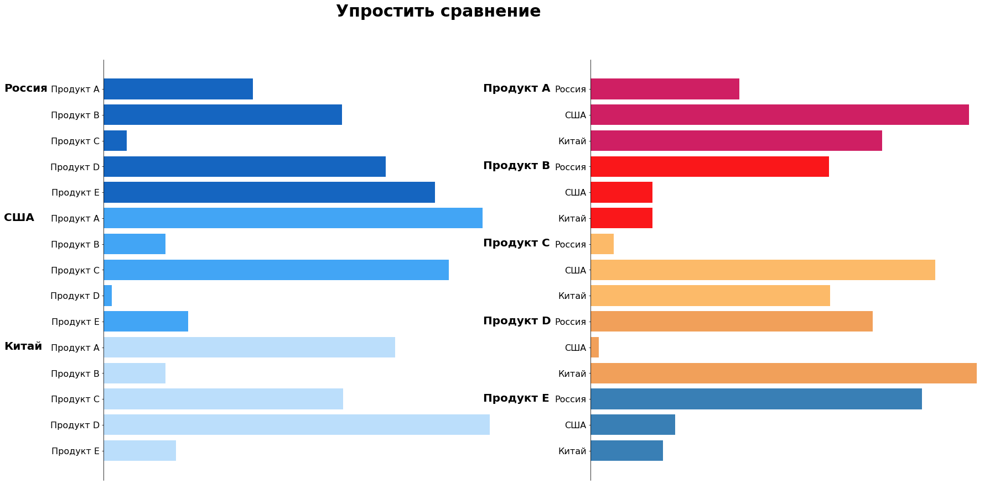

In [21]:
countries = ['Россия', 'США', 'Китай']

np.random.seed(42)
product_A = [i for i in np.random.rand(3)]
product_B = [i for i in np.random.rand(3)]
product_C = [i for i in np.random.rand(3)]
product_D = [i for i in np.random.rand(3)]
product_E = [i for i in np.random.rand(3)]
product_list = [product_E, product_D, product_C, product_B, product_A]

fig, axes = plt.subplots(1, 2, figsize=(28, 14), gridspec_kw={'left': 0.2, 'right': 1, 'wspace': 0.2})
fig.suptitle('Упростить сравнение', fontsize=30, fontweight='bold')

axes[0].barh(np.arange(11, 16), [i[0] for i in product_list], color='#1565C0')
axes[0].barh(np.arange(6, 11), [i[1] for i in product_list], color='#42A5F5')
axes[0].barh(np.arange(1, 6), [i[2] for i in product_list], color='#BBDEFB')

axes[0].set_yticks(np.arange(1, 16))
axes[0].set_yticklabels(np.array([['Продукт ' + i for i in ['E', 'D', 'C', 'B', 'A']] for _ in range(3)]).flatten(), fontsize=16)
axes[0].text(-0.25, 14.9, 'Россия', fontsize=20, fontweight='bold')
axes[0].text(-0.25, 9.9, 'США', fontsize=20, fontweight='bold')
axes[0].text(-0.25, 4.9, 'Китай', fontsize=20, fontweight='bold')

axes[1].barh(np.arange(13, 16), product_A[-1::-1], color='#CF1F63')
axes[1].barh(np.arange(10, 13), product_B[-1::-1], color='#FA171A')
axes[1].barh(np.arange(7, 10), product_C[-1::-1], color='#FCBA69')
axes[1].barh(np.arange(4, 7), product_D[-1::-1], color='#F1A05A')
axes[1].barh(np.arange(1, 4), product_E[-1::-1], color='#397FB5')

axes[1].set_yticks(np.arange(1, 16))
axes[1].set_yticklabels(np.array([[i for i in ['Китай', 'США', 'Россия']] for _ in range(5)]).flatten(), fontsize=16)
axes[1].text(-0.27, 14.9, 'Продукт A', fontsize=20, fontweight='bold')
axes[1].text(-0.27, 11.9, 'Продукт B', fontsize=20, fontweight='bold')
axes[1].text(-0.27, 8.9, 'Продукт C', fontsize=20, fontweight='bold')
axes[1].text(-0.27, 5.9, 'Продукт D', fontsize=20, fontweight='bold')
axes[1].text(-0.27, 2.9, 'Продукт E', fontsize=20, fontweight='bold')

for ax in axes:
    ax.set_xticks(())
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

plt.show()

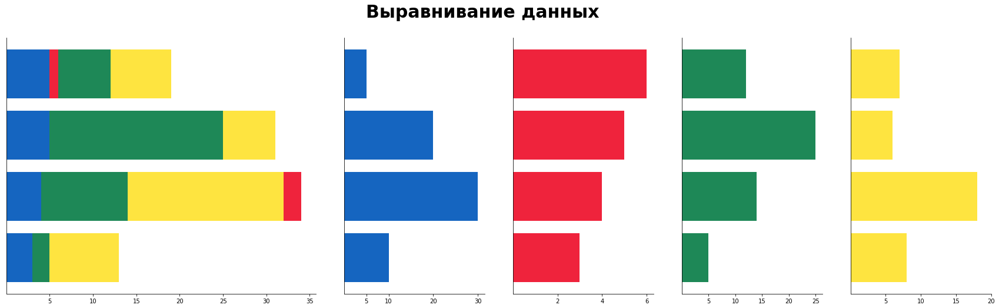

In [22]:
fig = plt.figure(figsize=(30, 8))
fig.suptitle('Выравнивание данных', fontsize=30, fontweight='bold')

gs = gridspec.GridSpec(1, 6)
ax1 = plt.subplot(gs[0, :2])
ax2 = plt.subplot(gs[0, 2])
ax3 = plt.subplot(gs[0, 3])
ax4 = plt.subplot(gs[0, 4])
ax5 = plt.subplot(gs[0, 5])

x = np.arange(4)
y1 = [10,30,20,5]
y2 = [3,4,5,6]
y3 = [5,14,25,12]
y4 = [8,18,6,7]

ax1.barh(x, y1, color='#1565C0')
ax1.barh(x, y2, left=y1, color='#EF233C')
ax1.barh(x, y3, left=y2, color='#1E8857')
ax1.barh(x, y4, left=y3, color='#FEE440')

ax2.barh(x, y1, color='#1565C0')
ax3.barh(x, y2, color='#EF233C')
ax4.barh(x, y3, color='#1E8857')
ax5.barh(x, y4, color='#FEE440')

ax1.set_xticks((5, 10, 15, 20, 25, 30, 35))
ax2.set_xticks((5, 10, 20, 30))
ax3.set_xticks((2, 4, 6))
ax4.set_xticks((5, 10, 15, 20, 25))
ax5.set_xticks((5, 10, 15, 20))

for ax in [ax1, ax2, ax3, ax4, ax5]:
    ax.set(yticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


plt.show()

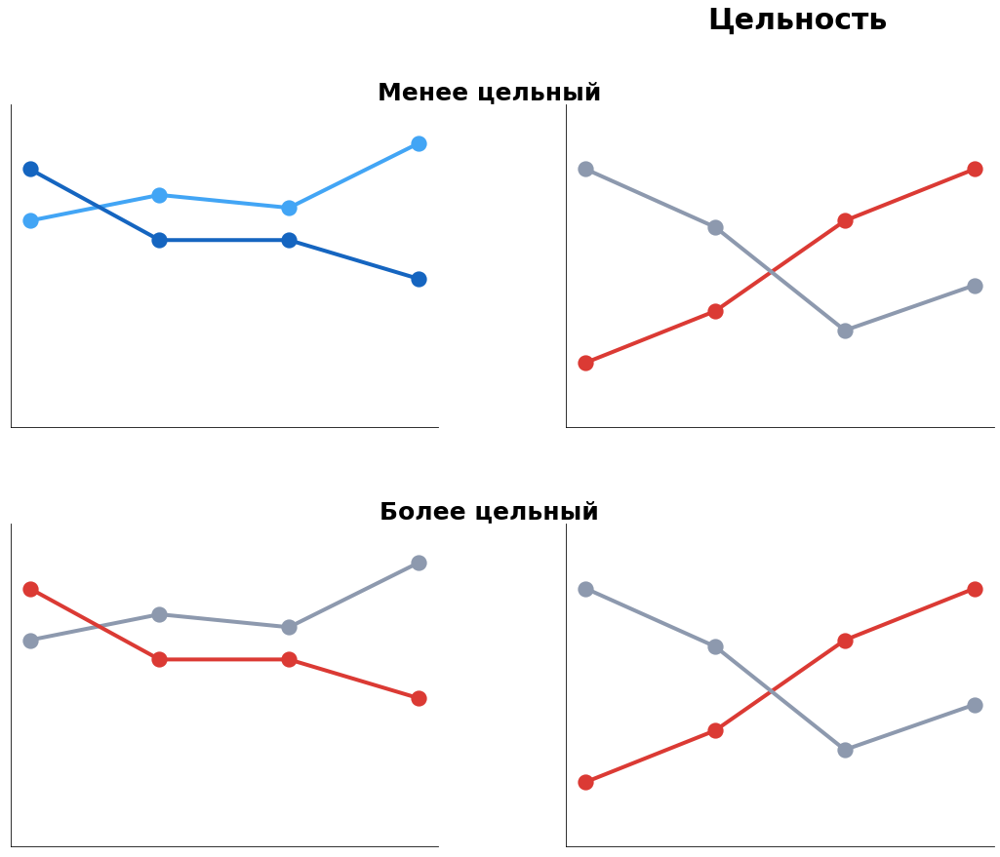

In [23]:
fig, axes = plt.subplots(2, 2, figsize=(28, 14), gridspec_kw={'wspace': 0.3, 'hspace': 0.3, 'left':0.2, 'right': 0.7})
fig.suptitle('Цельность', fontsize=30, fontweight='bold', x=0.6)

x = np.arange(1, 5)
y1 = [32, 36, 34, 44]
y2 = [40, 29, 29, 23]
y3 = [10, 18, 32, 40]
y4 = [40, 31, 15, 22]

axes[0][0].plot(x, y1, linewidth=4, color='#42A5F5')
axes[0][0].scatter(x, y1, 150, linewidth=4, color='#42A5F5')
axes[0][0].plot(x, y2, linewidth=4, color='#1565C0')
axes[0][0].scatter(x, y2, 150, linewidth=4, color='#1565C0')
axes[0][0].set_ylim((0, 50))

axes[0][1].plot(x, y3, linewidth=4, color='#DB3A34')
axes[0][1].scatter(x, y3, 150, linewidth=4, color='#DB3A34')
axes[0][1].plot(x, y4, linewidth=4, color='#8D99AE')
axes[0][1].scatter(x, y4, 150, linewidth=4, color='#8D99AE')
axes[0][1].set_title('Менее цельный', fontsize=25, fontweight='bold', x=-0.18)
axes[0][1].set_ylim((0, 50))

axes[1][0].plot(x, y1, linewidth=4, color='#8D99AE')
axes[1][0].scatter(x, y1, 150, linewidth=4, color='#8D99AE')
axes[1][0].plot(x, y2, linewidth=4, color='#DB3A34')
axes[1][0].scatter(x, y2, 150, linewidth=4, color='#DB3A34')
axes[1][0].set_title('Более цельный ', fontsize=25, fontweight='bold', x=1.13)
axes[1][0].set_ylim((0, 50))

axes[1][1].plot(x, y3, linewidth=4, color='#DB3A34')
axes[1][1].scatter(x, y3, 150, linewidth=4, color='#DB3A34')
axes[1][1].plot(x, y4, linewidth=4, color='#8D99AE')
axes[1][1].scatter(x, y4, 150, linewidth=4, color='#8D99AE')
axes[1][1].set_ylim((0, 50))

for ax in axes.flat:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

<div style='font-weight: 700; font-size: 40px; text-align: center;'>Data-Ink Ratio</div>
<br>
<div style='height: 140px'>
    <span style='font-size: 25px'>$$Data-Ink = \frac{data-ink}{total \: ink \: used}$$</span>
    <br>
    <span style='display: block; margin: 0 auto; text-align: center; font-size: 20px;'><i>Source: </i>The Visual Display of Quantitative Information</span>
</div>

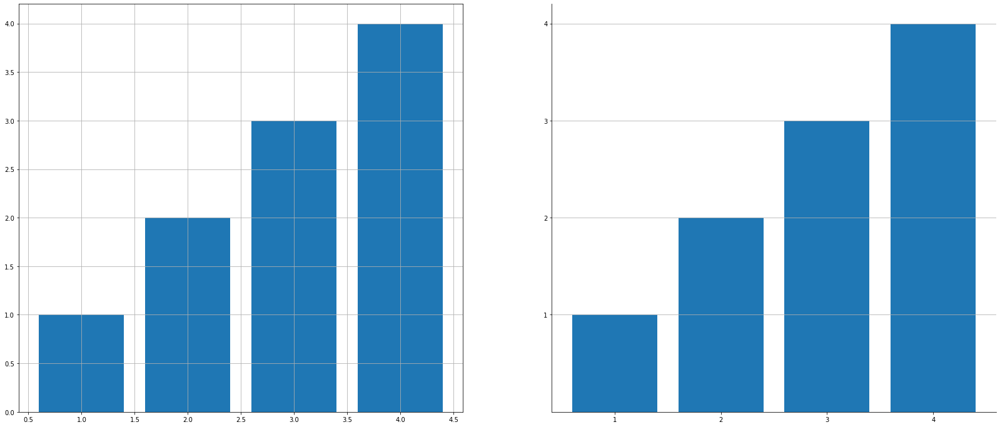

In [9]:
figure, axes = plt.subplots(1, 2, figsize=(28, 12))

axes[0].bar([1, 2, 3, 4], [1, 2, 3, 4])
axes[0].grid()

axes[1].bar([1, 2, 3, 4], [1, 2, 3, 4])
axes[1].grid(axis='y')
axes[1].set_xticks((1, 2, 3, 4))
axes[1].set_yticks((1, 2, 3, 4))
axes[1].spines['right'].set_visible(False)
axes[1].spines['top'].set_visible(False)

plt.show()

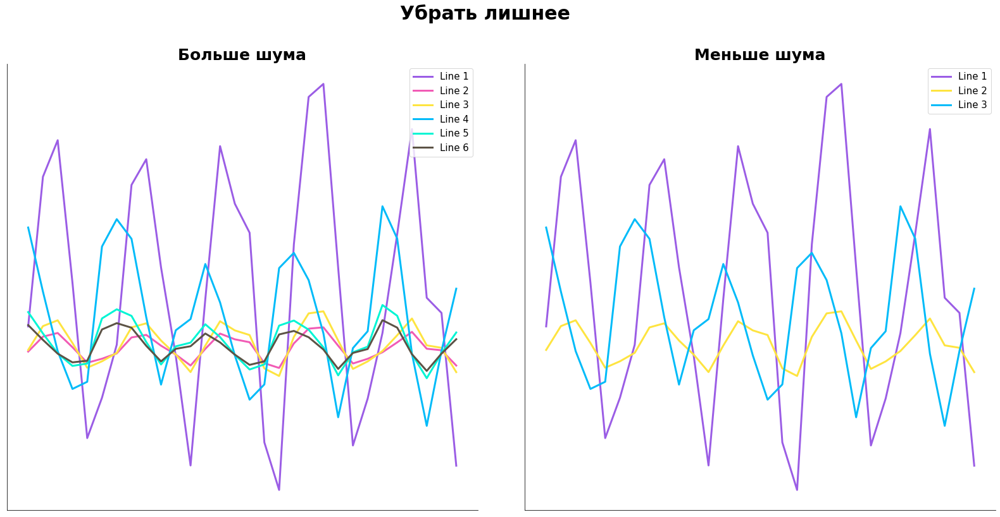

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(28, 13), gridspec_kw={'wspace': 0.1, 'hspace': 0.1}, )
fig.suptitle('Убрать лишнее', fontsize=30, fontweight='bold')

x = np.linspace(0, 30, 30)
y1 = np.sin(x) + np.random.rand(30)
y2 = np.cos(x) + np.random.rand(30)
c = ['#9B5DE5', '#F15BB5', '#FEE440', '#00BBF9', '#00F5D4', '#5C5346']

axes[0].plot(x, y1*2, linewidth=3, color=c[0])
axes[0].plot(x, y1 / 5, linewidth=3, color=c[1])
axes[0].plot(x, y1 /3.14, linewidth=3, color=c[2])
axes[0].plot(x, y2, linewidth=3, color=c[3])
axes[0].plot(x, y2/3, linewidth=3, color=c[4])
axes[0].plot(x, y2/3*np.log(2), linewidth=3, color=c[5])

axes[0].legend(['Line ' + str(i) for i in range(1, 8)], prop={'size': 15}, loc='upper right')
axes[0].set_title('Больше шума', fontsize=25, fontweight='bold')

axes[1].plot(x, y1*2, linewidth=3, color=c[0])
axes[1].plot(x, y1 /3.14, linewidth=3, color=c[2])
axes[1].plot(x, y2, linewidth=3, color=c[3])
axes[1].legend(['Line ' + str(i) for i in range(1, 4)], prop={'size': 15}, loc='upper right')
axes[1].set_title('Меньше шума', fontsize=25, fontweight='bold')


for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
plt.show()

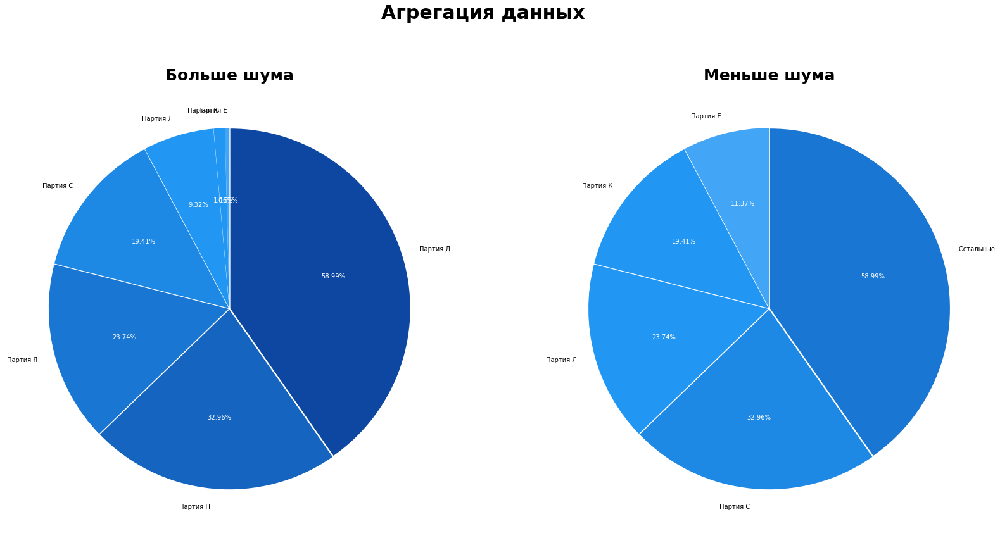

In [25]:
labels = ['Партия Е', 'Партия К', 'Партия Л', 'Партия С', 'Партия Я', 'Партия П', 'Партия Д']
labels1 = ['Партия Е', 'Партия К', 'Партия Л', 'Партия С', 'Остальные']
sizes = [58.99, 32.96, 23.74, 19.41, 9.32, 1.46, 0.59]
sizes1 = [58.99, 32.96, 23.74, 19.41, 11.37]
colors=['#0d47a1', '#1565c0', '#1976d2', '#1e88e5', '#2196f3', '#2196f3', '#42a5f5']
explode = (0.005, 0.005, 0.005, 0.005, 0.005)
explode1 = (0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005)

total = sum(sizes)

fig, axes = plt.subplots(1, 2, figsize=(28, 14))

axes[0].set_title('Больше шума', fontsize=25, fontweight='bold')
axes[1].set_title('Меньше шума', fontsize=25, fontweight='bold')

_, _, autotexts = axes[0].pie(sorted(sizes), labels=labels, explode=explode1, autopct=lambda p: '{:2.2f}%'.format(p * total / 100),
         startangle=90, colors=colors[-1::-1])
for autotext in autotexts:
    autotext.set_color('white')

_, _, autotexts = axes[1].pie(sorted(sizes1), labels=labels1, explode=explode, autopct=lambda p: '{:2.2f}%'.format(p * total / 100),
         startangle=90, colors=colors[-1::-1])
for autotext in autotexts:
    autotext.set_color('white')
    
fig.suptitle('Агрегация данных', fontsize=30, fontweight='bold')
plt.show()

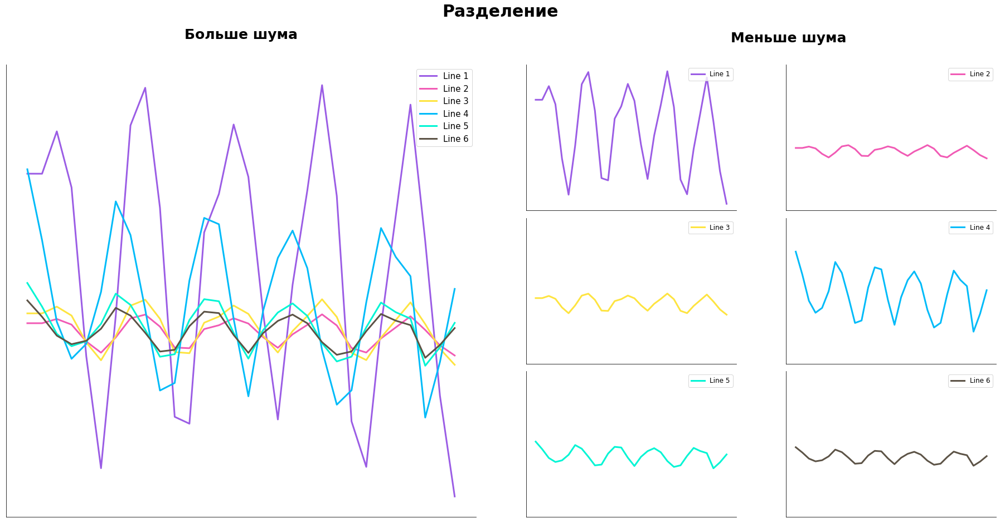

In [36]:
fig = plt.figure(figsize=(25, 13))
fig.suptitle('Разделение', fontsize=30, fontweight='bold', y=1)

x = np.linspace(0, 30, 30)
y1 = np.sin(x) + np.random.rand(30)
y2 = np.cos(x) + np.random.rand(30)

#subfigs = fig.subfigures(nrows=1, ncols=2)
y = [y1*2, y1/5, y1/3.14, y2, y2/3, y2/3*np.log(2)]
c = ['#9B5DE5', '#F15BB5', '#FEE440', '#00BBF9', '#00F5D4', '#5C5346']

gs = gridspec.GridSpec(3, 4)

ax1 = plt.subplot(gs[:, :2])
ax2 = plt.subplot(gs[0, 2])
ax3 = plt.subplot(gs[0, 3])
ax4 = plt.subplot(gs[1, 2])
ax5 = plt.subplot(gs[1, 3])
ax6 = plt.subplot(gs[2, 2])
ax7 = plt.subplot(gs[2, 3])

ax1.plot(x, y[0], linewidth=3, color=c[0])
ax1.plot(x, y[1], linewidth=3, color=c[1])
ax1.plot(x, y[2], linewidth=3, color=c[2])
ax1.plot(x, y[3], linewidth=3, color=c[3])
ax1.plot(x, y[4], linewidth=3, color=c[4])
ax1.plot(x, y[5], linewidth=3, color=c[5])

ax1.legend(['Line ' + str(i) for i in range(1, 8)], prop={'size': 15}, loc='upper right')
ax1.set_title('Больше шума', fontsize=25, y=1.05, fontweight='bold')
ax1.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)

ax2.plot(x, y[0], linewidth=3, color=c[0])
ax3.plot(x, y[1], linewidth=3, color=c[1])
ax4.plot(x, y[2], linewidth=3, color=c[2])
ax5.plot(x, y[3], linewidth=3, color=c[3])
ax6.plot(x, y[4], linewidth=3, color=c[4])
ax7.plot(x, y[5], linewidth=3, color=c[5])

ax2.set_title('Меньше шума', fontsize=25, y=1.13, x=1.25, fontweight='bold')

xlim = ax1.get_xlim()
ylim = ax1.get_ylim()

for i, ax in enumerate([ax2, ax3, ax4, ax5, ax6, ax7]):
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)
    ax.legend([f'Line {i+1}'], prop={'size': 12}, loc='upper right')
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.tight_layout(pad=1)

<div style='font-weight: 700; font-size: 50px; text-align: center;'>Chartjunk</div>
<img src='https://upload.wikimedia.org/wikipedia/commons/thumb/7/7a/K%C3%BChlschifffahrt_Bananen_Exporte_2007.png/1024px-K%C3%BChlschifffahrt_Bananen_Exporte_2007.png'>

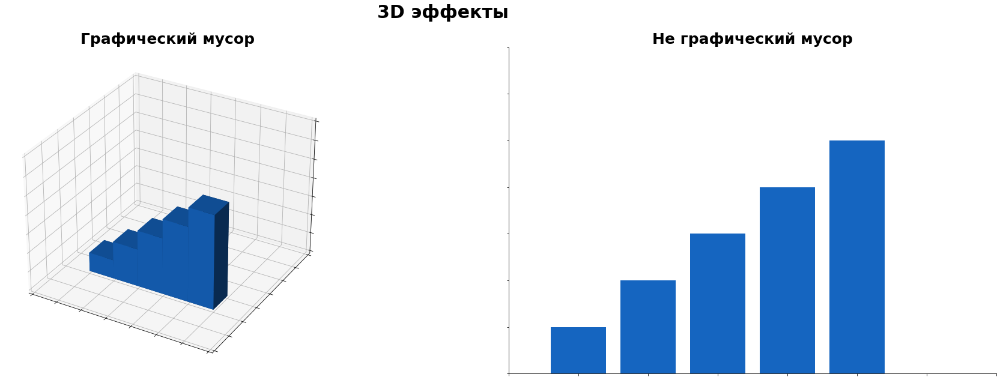

In [37]:
fig = plt.figure(figsize=(32, 10))
fig.suptitle('3D эффекты', fontsize=30, fontweight='bold')


ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122)

x = np.arange(1, 6)
z = np.arange(1, 6)

ax1.bar3d(x, 2, 0, 1, 1, z, shade=True, color='#1565C0')
ax1.set_xlim(0, 7)
ax1.set_ylim(0, 7)
ax1.set_zlim(0, 7)
ax1.set_title('Графический мусор', fontsize=25, fontweight='bold')
ax1.set_xticklabels(())
ax1.set_yticklabels(())
ax1.set_zticklabels(())

ax2.bar(x, z, color='#1565C0')
ax2.set_xlim(0, 7)
ax2.set_ylim(0, 7)
ax2.set_title('Не графический мусор', fontsize=25, fontweight='bold')
ax2.set_xticklabels(())
ax2.set_yticklabels(())
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)

plt.show()

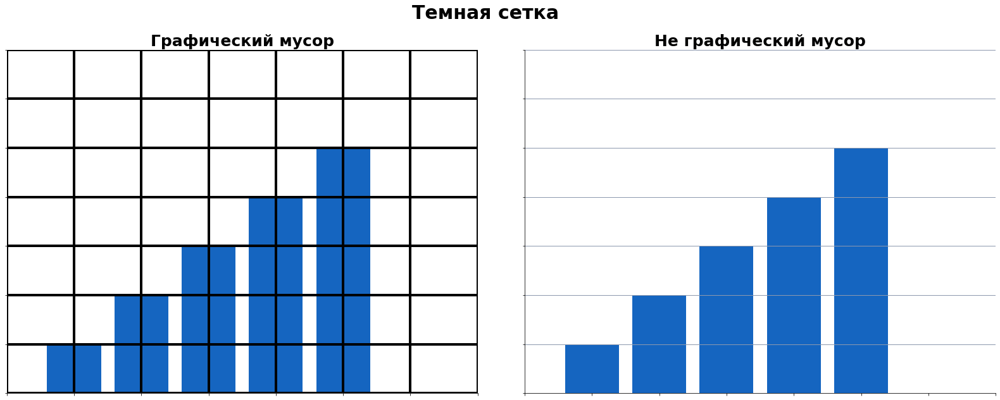

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Темная сетка', fontsize=30, fontweight='bold')

x = np.arange(1, 6)
z = np.arange(1, 6)

axes[0].bar(x, z, color='#1565C0')
axes[0].set_xlim(0, 7)
axes[0].set_ylim(0, 7)
axes[0].set_title('Графический мусор', fontsize=25, fontweight='bold')
axes[0].grid(axis='both', color='black', linewidth=4)

axes[1].bar(x, z, color='#1565C0')
axes[1].set_xlim(0, 7)
axes[1].set_ylim(0, 7)
axes[1].set_title('Не графический мусор', fontsize=25, fontweight='bold')
axes[1].grid(axis='y', linewidth=1, color='#8D99AE')

for ax in axes:
    ax.set(xticklabels=(), xlabel=None, yticklabels=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

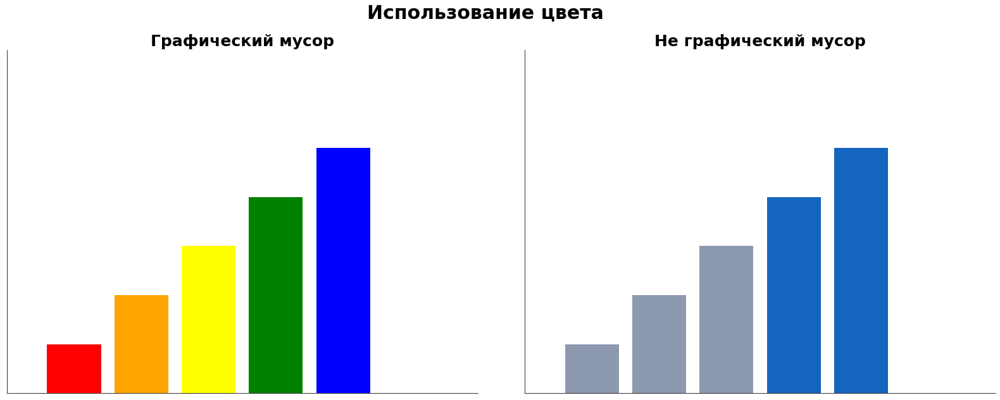

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Использование цвета', fontsize=30, fontweight='bold')

x = np.arange(1, 6)
z = np.arange(1, 6)

axes[0].bar(x, z, color=['red', 'orange', 'yellow', 'green', 'blue'])
axes[0].set_xlim(0, 7)
axes[0].set_ylim(0, 7)
axes[0].set_title('Графический мусор', fontsize=25, fontweight='bold')

axes[1].bar(x, z, color='#8D99AE')
axes[1].bar(x[3:], z[3:], color='#1565C0')
axes[1].set_xlim(0, 7)
axes[1].set_ylim(0, 7)
axes[1].set_title('Не графический мусор', fontsize=25, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

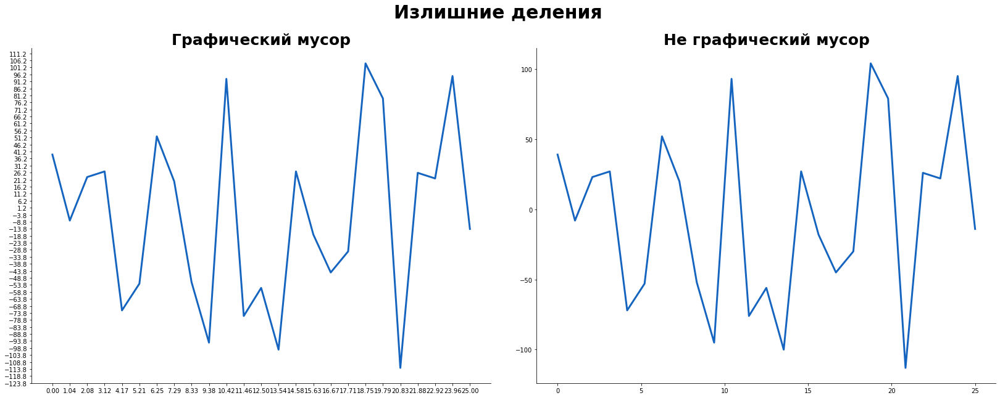

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Излишние деления', fontsize=30, fontweight='bold')

x = np.linspace(0, 25, 25)
y = (np.random.randn(25)*100).astype(np.int8)

axes[0].plot(x, y, linewidth=3, color='#1565C0')
axes[0].set_title('Графический мусор', fontsize=25, fontweight='bold')

ymin=axes[0].get_ylim()[0]
ymax=axes[0].get_ylim()[1]
axes[0].set(xticks=(x), xlabel=None, yticks=(np.arange(ymin, ymax, 5)), ylabel=None)

axes[1].plot(x, y, linewidth=3, color='#1565C0')
axes[1].set_title('Не графический мусор', fontsize=25, fontweight='bold')


for ax in axes:
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

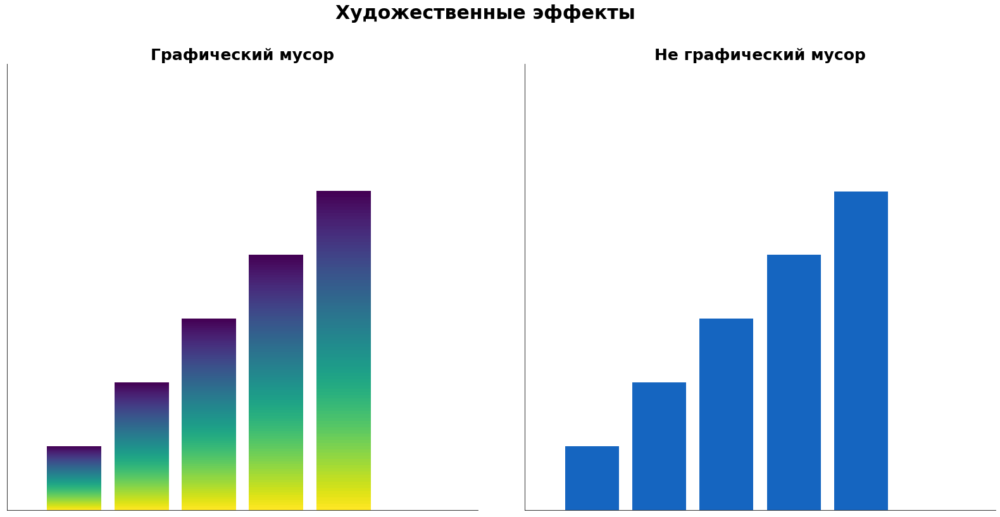

In [41]:
def gradientbars(bars):
    grad = np.atleast_2d(np.linspace(0.5, 1.5, 100)).T
    ax = bars[0].axes
    for bar in bars:
        bar.set_zorder(1)
        bar.set_facecolor("none")
        x, y = bar.get_xy()
        w, h = bar.get_width(), bar.get_height()
        ax.imshow(grad, extent=[x,x+w,y,y+h], aspect="auto", zorder=0)

fig, axes = plt.subplots(1, 2, figsize=(28, 13), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Художественные эффекты', fontsize=30, fontweight='bold')

x = np.arange(1, 6)
z = np.arange(1, 6)

bar = axes[0].bar(x, z)
axes[0].set_xlim(0, 7)
axes[0].set_ylim(0, 7)
axes[0].set_title('Графический мусор', fontsize=25, fontweight='bold')
gradientbars(bar)

axes[1].bar(x, z, color='#1565C0')
axes[1].set_xlim(0, 7)
axes[1].set_ylim(0, 7)
axes[1].set_title('Не графический мусор', fontsize=25, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

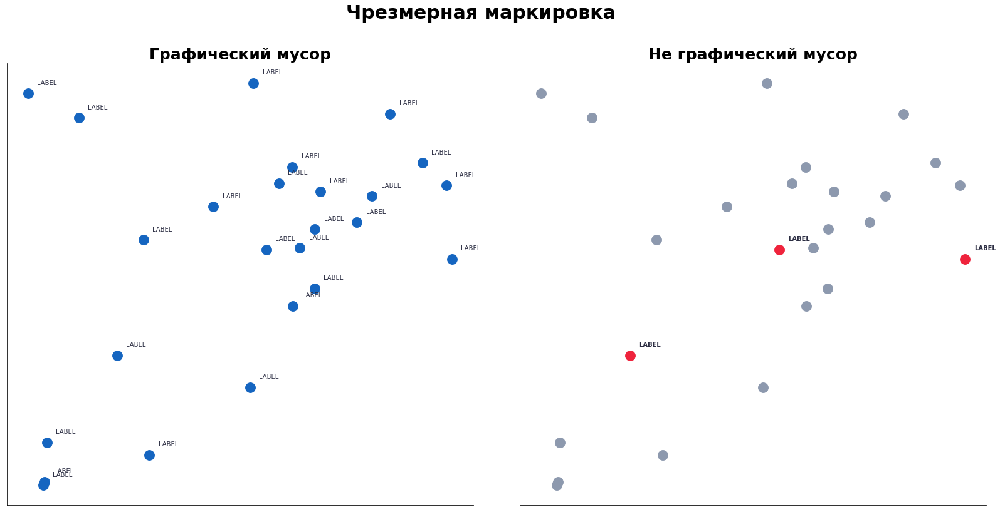

In [42]:
x = [0.95746191, 0.54897903, 0.22076161, 0.13702722, 0.74805263,
       0.29173055, 0.78150446, 0.65586291, 0.06638412, 0.62303504,
       0.06164918, 0.27856213, 0.89254479, 0.8217758 , 0.60659706,
       0.52064142, 0.57633145, 0.02470461, 0.51349687, 0.65517936,
       0.66818852, 0.9458934 , 0.05915504, 0.43243767, 0.60772387]
y = [0.52892259, 0.55144692, 0.30610779, 0.85589936, 0.61394426,
       0.07572432, 0.67511932, 0.59813073, 0.10448175, 0.55471068,
       0.01319353, 0.57367412, 0.75195234, 0.86501862, 0.74208021,
       0.93652803, 0.70445345, 0.91225394, 0.23252521, 0.46134759,
       0.68520687, 0.6997237 , 0.0057934 , 0.65053825, 0.42088492]

fig, axes = plt.subplots(1, 2, figsize=(28, 13), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Чрезмерная маркировка', fontsize=30, fontweight='bold')

axes[0].scatter(x, y, s=250, color='#1565C0')
axes[0].set_title('Графический мусор', fontsize=25, fontweight='bold')

axes[1].scatter(x[3:25], y[3:25], color='#8D99AE', s=250)
axes[1].scatter(x[0:3], y[0:3], color='#EF233C', s=250)
axes[1].set_title('Не графический мусор', fontsize=25, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


for i in range(len(x)):
     axes[0].text(x=x[i]+0.02, y=y[i]+0.02, s='LABEL', color='#2B2D42')
        
for i in range(0, 3):
    axes[1].text(x=x[i]+0.02, y=y[i]+0.02, s='LABEL', color='#2B2D42', fontweight='bold')

<div style='font-weight: 700; font-size: 50px; text-align: center;'>Фокусировка внимания</div>

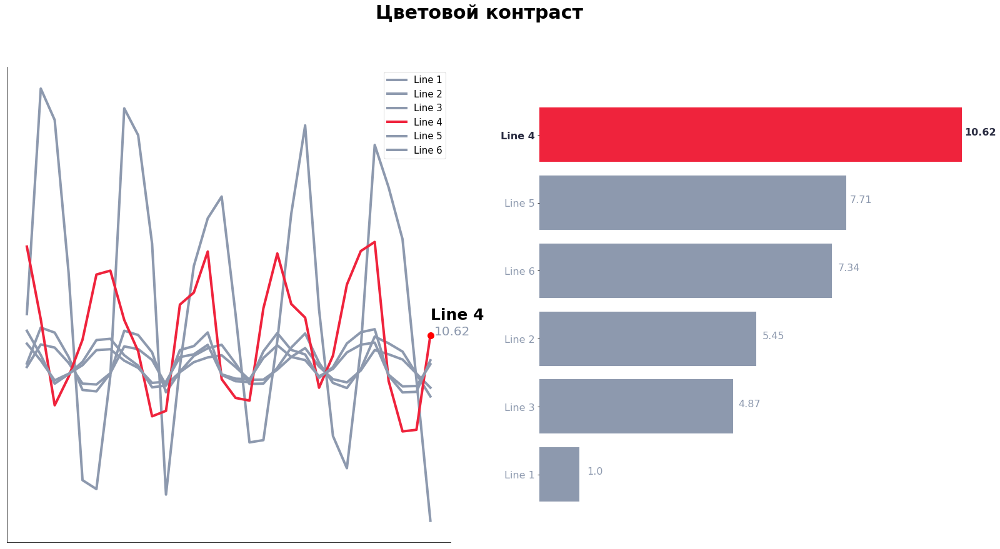

In [67]:
fig, axes = plt.subplots(1, 2, figsize=(28, 14), gridspec_kw={'wspace': 0.2})
fig.suptitle('Цветовой контраст', fontsize=30, fontweight='bold')

x = np.linspace(0, 30, 30)
np.random.seed(42)
y1 = np.sin(x) + np.random.rand(30)
y2 = np.cos(x) + np.random.rand(30)
labels=['Line ' + str(i) for i in range(1, 7)]

y = [y1*2, y1/5, y1/3.14, y2, y2/3, y2/3*np.log(2)]

axes[0].plot(x, y[0], linewidth=4, color='#8D99AE')
axes[0].plot(x, y[1], linewidth=4, color='#8D99AE')
axes[0].plot(x, y[2], linewidth=4, color='#8D99AE')
axes[0].plot(x, y[3], linewidth=4, color='#EF233C')
axes[0].plot(x, y[4], linewidth=4, color='#8D99AE')
axes[0].plot(x, y[5], linewidth=4, color='#8D99AE')
axes[0].plot(30, y[3][-1], 'o', color='red', markersize=10)
axes[0].text(30, y[3][-1]+0.2, 'Line 4', fontsize=25, fontweight='bold')
axes[0].text(30.3, y[3][-1], '10.62', fontsize=20, color='#8D99AE')

axes[0].legend(labels, prop={'size': 15}, loc='upper right')

axes[0].set(xticks=(), xlabel=None, yticks=(), ylabel=None)

results = np.array([i[-1] for i in y])
results = np.exp(results + np.abs(min(results)))
res_dict = {l: r for l, r in zip(labels, results)}
res_dict = dict(sorted(res_dict.items(), key=lambda item: item[1]))

texts = [1.0, 4.87, 5.45, 7.34, 7.71, 10.62]
x_num = [1.2, 5, 5.6, 7.5, 7.8, 10.2]

for i in range(6):
    if (i==5):
        hbars = axes[1].barh(i, list(res_dict.values())[i], align='center', color='#EF233C')
        axes[1].text(y[3][-1] + 10.2, i, texts[i], fontsize=16, color='#2B2D42', fontweight='bold')
        continue
    hbars = axes[1].barh(i, list(res_dict.values())[i], align='center', color='#8D99AE')
    axes[1].text(x_num[i], i, texts[i], fontsize=16, color='#8D99AE')

#axes[1].barh(5, max(res_dict.values()), align='center', color='red')
axes[1].set_ylim((-1, 6))
axes[1].set_yticks((0, 1, 2, 3, 4, 5))
axes[1].set_xticks(())

axes[1].set_yticklabels(res_dict.keys(), fontsize=16, color='#8D99AE')
axes[1].get_yticklabels()[-1].set_color('#2B2D42')
axes[1].get_yticklabels()[-1].set_fontweight('bold')

axes[1].spines['left'].set_visible(False)
axes[1].spines['bottom'].set_visible(False)

for ax in axes:
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

<div style='font-weight: 700; font-size: 40px; text-align: center;'>Цвет</div>

<div style='display: block; width: 80%; margin: 0 auto;'> 
    <img src="https://blog.datawrapper.de/wp-content/uploads/2021/03/200801_colorscale-intro-f-1-1024x512.png" height="700", width="2500">
    <span style='display: block; font-size: 18px; text-align: center'><i>Source: </i><a src='https://blog.datawrapper.de'>blog.datawrapper.de</a></span>
</div>

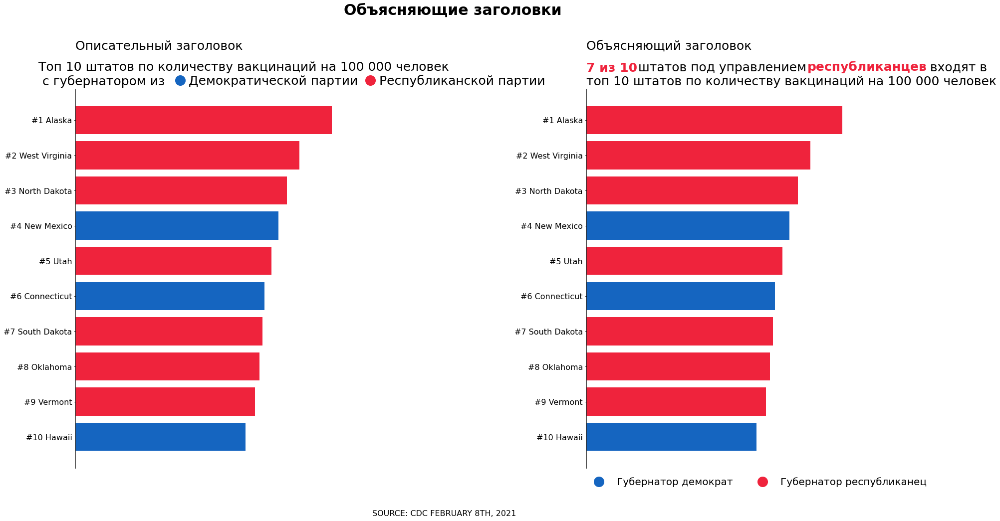

In [92]:
fig, axes = plt.subplots(1, 2, figsize=(28, 14), gridspec_kw={'hspace': 15, 'wspace': 0.9})
fig.suptitle('Объясняющие заголовки', fontsize=30, fontweight='bold', y=1.05)

amount_blue = [16348, 15214, 13704]
amount_red = [20632, 18045, 17030, 15803, 15042, 14811, 14476]

states = ['Alaska', 'West Virginia', 'North Dakota', 'New Mexico', 'Utah', 'Connecticut', 'South Dakota', 'Oklahoma', 'Vermont', 'Hawaii']

for ax in axes:
    hbars = ax.barh([7, 5, 1], amount_blue, color='#1565C0')
    #ax.bar_label(hbars, fmt='%.0f', fontsize=16, color='#2B2D42')
    #for i, j, k in zip(amount_blue, [7, 5, 1], np.arange(3)):
    #    axes[0].text(amount[k]-2500, j, i, fontsize=16)
    
    hbars = ax.barh([10, 9, 8, 6, 4, 3, 2], amount_red, color='#EF233C')
    #ax.bar_label(hbars, fmt='%.0f', fontsize=16, color='#2B2D42')
    ax.set(xticks=(), xlabel=None, yticks=np.arange(1, 11), ylabel=None)
    ax.set_yticklabels(['#' + str(i) +' '+ j for i,j in zip(sorted(np.arange(1, 11), reverse=True), states[-1::-1])], fontsize=16)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    
    
from matplotlib.lines import Line2D    
line1 = Line2D([], [], color='#1565C0', marker='o', linestyle='None', markersize=20, label='Демократической партии')
line2 = Line2D([], [], color='#EF233C', marker='o', linestyle='None', markersize=20, label='Республиканской партии')

axes[0].legend(handles=[line1, line2], bbox_to_anchor=(0.3, 0.975), numpoints=1, fontsize=25, framealpha=0.0, ncol=2, handletextpad=-0.3, columnspacing=0)

#axes[0].legend(['Демократической партии', 'Республиканской партии'], fontsize=20, bbox_to_anchor=(0.35, 0.98), framealpha=0.0, ncol=2)
axes[0].text(0, 12, 'Описательный заголовок', fontsize=25)
axes[0].text(-3000, 11, 'Топ 10 штатов по количеству вакцинаций на 100 000 человек\n с губернатором из ', fontsize=25)

line1 = Line2D([], [], color='#1565C0', marker='o', linestyle='None', markersize=20, label='Губернатор демократ')
line2 = Line2D([], [], color='#EF233C', marker='o', linestyle='None', markersize=20, label='Губернатор республиканец')
axes[1].legend(handles=[line1, line2], fontsize=20, bbox_to_anchor=(1.3, 0), framealpha=0.0, ncol=2)
axes[1].text(0, 12, 'Объясняющий заголовок', fontsize=25)
axes[1].text(0, 11.38, '7 из 10', fontsize=25, color='#EF233C', fontweight='bold')
axes[1].text(0, 11, '             штатов под управлением                               входят в \nтоп 10 штатов по количеству вакцинаций на 100 000 человек', 
            fontsize=25) 
axes[1].text(17800, 11.41, 'республиканцев', fontsize=25, color='#EF233C', fontweight='bold')

fig.text(0.42, 0.03, 'SOURCE: CDC FEBRUARY 8TH, 2021', fontsize=16)
plt.show()

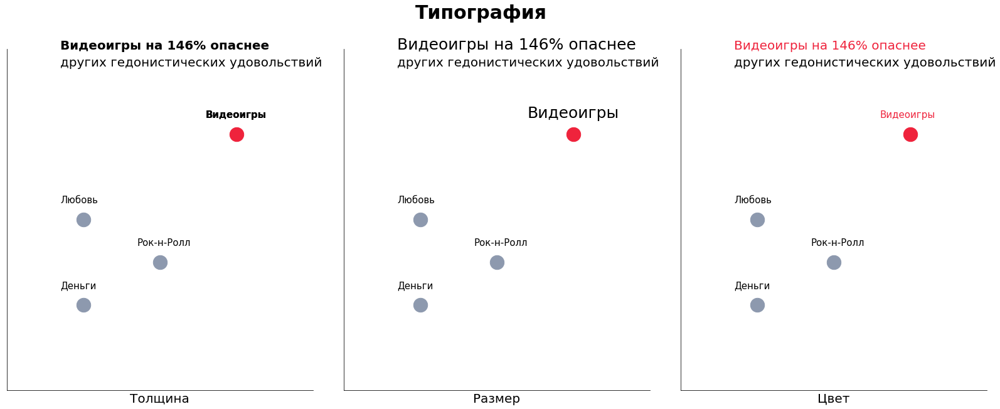

In [69]:
fig, axes = plt.subplots(1, 3, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 50})
fig.suptitle('Типография', fontsize=30, fontweight='bold')

axes[0].text(1.7, 5, 'Видеоигры на 146% опаснее', fontsize=20, weight='bold')
axes[0].text(1.7, 4.8, 'других гедонистических удовольствий', fontsize=20)
axes[0].text(3.6, 4.2, 'Видеоигры', fontsize=15, weight='bold')
axes[0].text(3.6, 4.2, 'Видеоигры', fontsize=15, weight='bold')

axes[1].text(1.7, 5, 'Видеоигры на 146% опаснее', fontsize=25)
axes[1].text(1.7, 4.8, 'других гедонистических удовольствий', fontsize=20)
axes[1].text(3.4, 4.2, 'Видеоигры', fontsize=25)

axes[2].text(1.7, 5, 'Видеоигры на 146% опаснее', fontsize=20, color='#EF233C')
axes[2].text(1.7, 4.8, 'других гедонистических удовольствий', fontsize=20)
axes[2].text(3.6, 4.2, 'Видеоигры', fontsize=15, color='#EF233C')


x = [2, 2, 3, 4]
y = [3, 2, 2.5, 4]
labels = ['Любовь', 'Деньги', 'Рок-н-Ролл']

for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.scatter(x[0:-1], y[0:-1], s=500, color='#8D99AE')
    ax.scatter(x[-1], y[-1], s=500, color='#EF233C')
    for i in range(len(x)-1):
        ax.text(x=x[i]-0.3, y=y[i]+0.2, s=labels[i], fontsize=15)
    ax.set_xlim((1, 5))
    ax.set_ylim((1, 5))
    
axes[0].set_xlabel('Толщина', fontsize=20)
axes[1].set_xlabel('Размер', fontsize=20)
axes[2].set_xlabel('Цвет', fontsize=20)

plt.show()

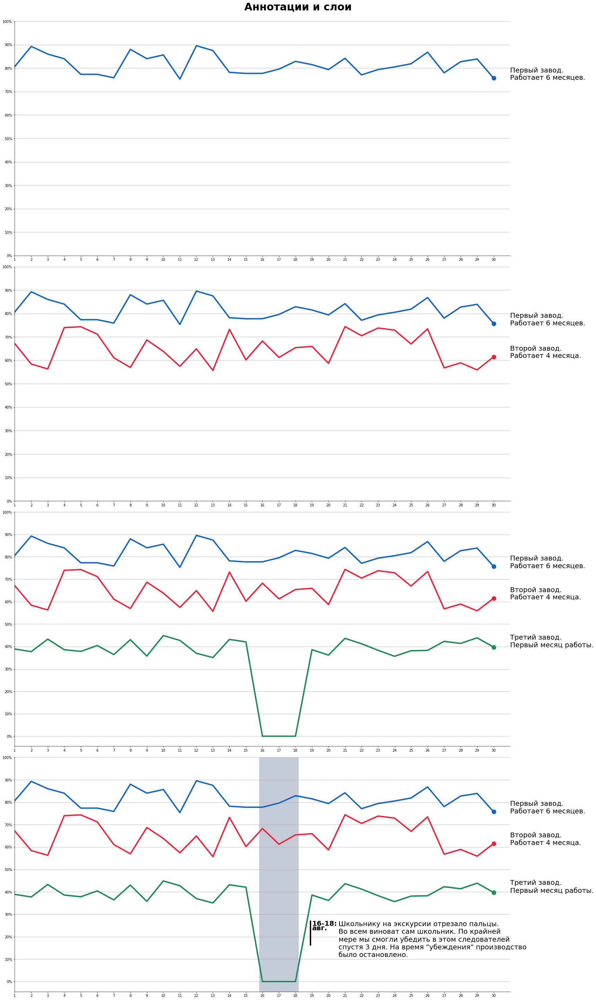

In [70]:
fig, axes = plt.subplots(4, 1, figsize=(24, 40), gridspec_kw={})
fig.suptitle('Аннотации и слои', fontsize=30, fontweight='bold', y=1.00)

np.random.seed(42) 
y1 = 75 + np.random.rand(30)*15
y2 = 55 + np.random.rand(30)*20
y3 = 35 + np.random.rand(30)*10
y3[15:18] = 0

for ax in axes:
    ax.plot(np.arange(1, 31), y1, linewidth=4, color='#1565C0')
    ax.scatter(30, 75.7, 150, color='#1565C0')
    ax.text(31, 75, 'Первый завод.\nРаботает 6 месяцев.', fontsize=20)
    
for ax in axes[1:]:
    ax.plot(np.arange(1, 31), y2, linewidth=4, color='#EF233C')
    ax.scatter(30, 61.5, 150, color='#EF233C')
    ax.text(31, 61, 'Второй завод.\nРаботает 4 месяца.', fontsize=20)
    
for ax in axes[2:]:
    ax.plot(np.arange(1, 31), y3, linewidth=4, color='#1E8857')
    ax.scatter(30, 39.7, 150, color='#1E8857')
    ax.text(31, 39.7, 'Третий завод.\nПервый месяц работы.', fontsize=20)
    
axes[3].text(19, 25, '16-18:', fontsize=20, fontweight='bold')
axes[3].text(19, 23, 'авг.', fontsize=20, fontweight='bold')
axes[3].text(20.6, 11, 'Школьнику на экскурсии отрезало пальцы.\nВо всем виноват сам школьник. ' 
             'По крайней \nмере мы смогли убедить в этом следователей\nспустя 3 дня. На время "убеждения" производство\nбыло остановлено.', fontsize=20)
axes[3].axvline(18.9, 0.20, 0.3, color='black', linewidth=4) 
axes[3].axvspan(15.8, 18.2, facecolor='#8D99AE', alpha=0.5)

for ax in axes:
    ax.set_xlim((1, 31))
    ax.set_xticks(np.arange(1, 31))
    ax.set_yticks(np.arange(0, 110, 10))
    ax.set_yticklabels([str(i) + '%' for i in np.arange(0, 110, 10)])
    ax.grid(axis='y')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

<div style='font-weight: 700; font-size: 40px; text-align: center;'>Маркировка</div>

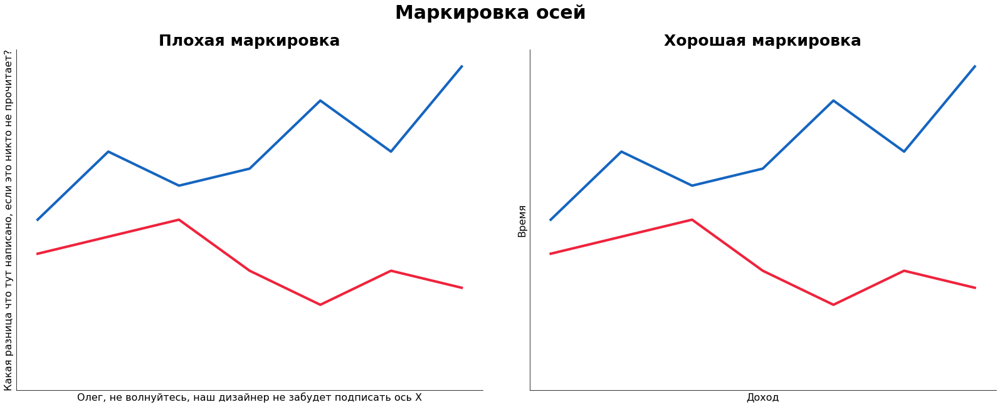

In [71]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Маркировка осей', fontsize=30, fontweight='bold')

x = np.arange(7)
y1 = [50, 70, 60, 65, 85, 70, 95]
y2 = [40, 45, 50, 35, 25, 35, 30]
y3 = [15, 25, 20, 35, 45, 40, 65]

axes[0].plot(x, y1, linewidth=4, color='#1565C0')
axes[0].plot(x, y2, linewidth=4, color='#EF233C')
axes[0].set_xlabel('Олег, не волнуйтесь, наш дизайнер не забудет подписать ось Х', fontsize=16)
axes[0].set_ylabel('Какая разница что тут написано, если это никто не прочитает?', fontsize=16)

axes[1].plot(x, y1, linewidth=4, color='#1565C0')
axes[1].plot(x, y2, linewidth=4, color='#EF233C')
axes[1].set_ylabel('Время', fontsize=16)
axes[1].set_xlabel('Доход', fontsize=16)

axes[0].set_title('Плохая маркировка', fontsize=25, fontweight='bold')
axes[1].set_title('Хорошая маркировка', fontsize=25, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), yticks=())
    ax.set_ylim((0, 100))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

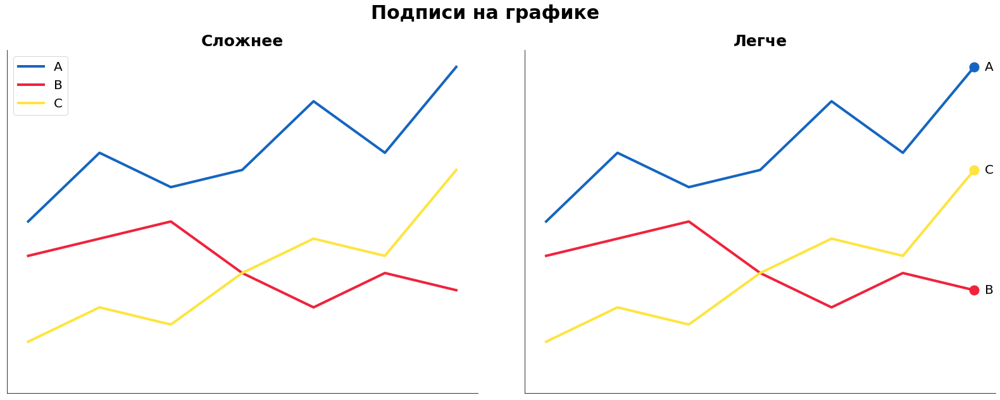

In [72]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Подписи на графике', fontsize=30, fontweight='bold')

x = np.arange(7)
y1 = [50, 70, 60, 65, 85, 70, 95]
y2 = [40, 45, 50, 35, 25, 35, 30]
y3 = [15, 25, 20, 35, 45, 40, 65]

axes[0].plot(x, y1, linewidth=4, color='#1565C0')
axes[0].plot(x, y2, linewidth=4, color='#EF233C')
axes[0].plot(x, y3, linewidth=4, color='#FEE440')
axes[0].legend(('A', 'B', 'C'), fontsize=20)

axes[1].plot(x, y1, linewidth=4, color='#1565C0')
axes[1].plot(x, y2, linewidth=4, color='#EF233C')
axes[1].plot(x, y3, linewidth=4, color='#FEE440')
axes[1].plot(x[-1], y1[-1], 'o', markersize=15, color='#1565C0')
axes[1].plot(x[-1], y2[-1], 'o', markersize=15, color='#EF233C')
axes[1].plot(x[-1], y3[-1], 'o', markersize=15, color='#FEE440')
axes[1].text(x[-1]+0.15, y1[-1]-1, 'A', fontsize=20)
axes[1].text(x[-1]+0.15, y2[-1]-1, 'B', fontsize=20)
axes[1].text(x[-1]+0.15, y3[-1]-1, 'C', fontsize=20)

axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')
axes[1].set_title('Легче', fontsize=25, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.set_ylim((0, 100))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

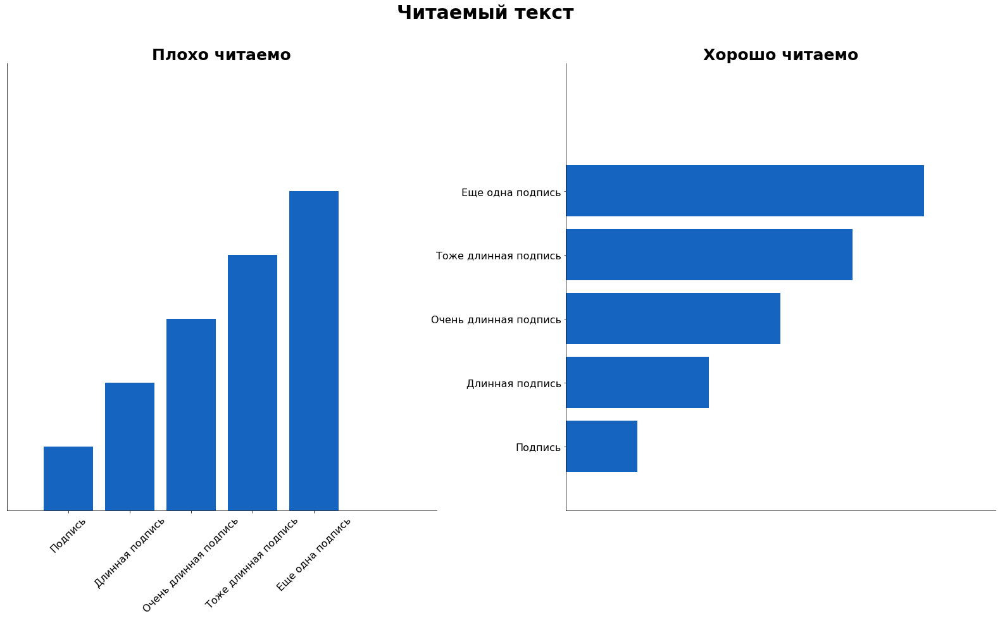

In [73]:
fig, axes = plt.subplots(1, 2, figsize=(28, 13), gridspec_kw={'wspace': 0.3, 'hspace': 0.1})
fig.suptitle('Читаемый текст', fontsize=30, fontweight='bold')

x = np.arange(1, 6)
z = np.arange(1, 6)
labels = ('Подпись', 'Длинная подпись', 'Очень длинная подпись', 'Тоже длинная подпись', 'Еще одна подпись')

axes[0].bar(x, z, color='#1565C0')
axes[0].set_xlim(0, 7)
axes[0].set_ylim(0, 7)
axes[0].set_title('Плохо читаемо', fontsize=25, fontweight='bold')
axes[0].set_xticks((1, 2, 3, 4, 5))
axes[0].set_xticklabels(labels, rotation=45, fontsize=16)
axes[0].set_yticks(())

axes[1].barh(x, z, color='#1565C0')
axes[1].set_xlim(0, 6)
axes[1].set_ylim(0, 7)
axes[1].set_title('Хорошо читаемо', fontsize=25, fontweight='bold')
axes[1].set_yticks((1, 2, 3, 4, 5))
axes[1].set_xticks(())
axes[1].set_yticklabels(labels, fontsize=16)

for ax in axes:
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

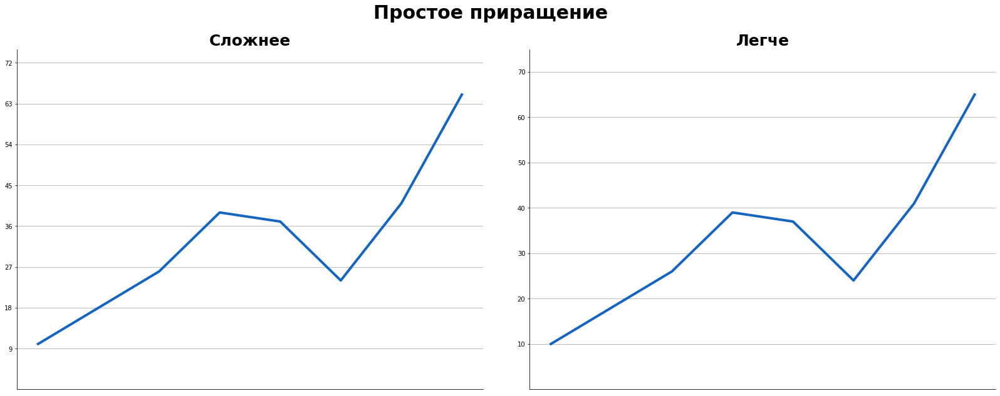

In [74]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Простое приращение', fontsize=30, fontweight='bold')

x = np.arange(8)
y = [10, 18, 26, 39, 37, 24, 41, 65]


axes[0].plot(x, y, linewidth=4, color='#1565C0')
axes[0].set_yticks((9, 18, 27, 36, 45, 54, 63, 72))
axes[0].grid(axis='y')
axes[1].plot(x, y, linewidth=4, color='#1565C0')
axes[1].set_yticks((10, 20, 30, 40, 50, 60, 70))
axes[1].grid(axis='y')

axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')
axes[1].set_title('Легче', fontsize=25, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), xlabel=None, ylabel=None)
    ax.set_ylim((0, 75))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

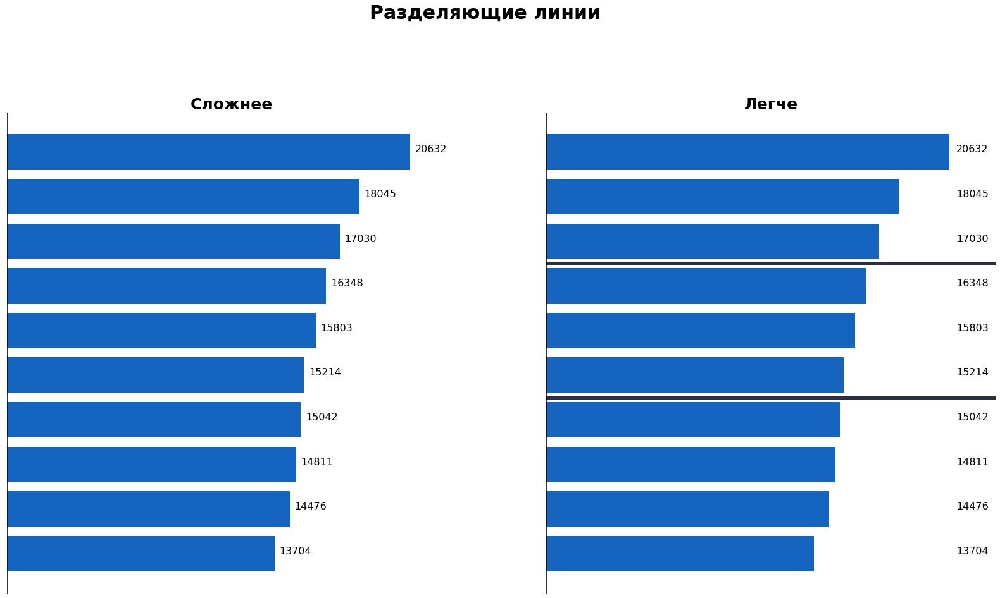

In [82]:
fig, axes = plt.subplots(1, 2, figsize=(28, 14), gridspec_kw={'hspace': 15, 'wspace': 0.2})
fig.suptitle('Разделяющие линии', fontsize=30, fontweight='bold', y=1.05)

amount = [20632, 18045, 17030, 16348, 15803, 15214, 15042, 14811, 14476, 13704]

hbars = axes[0].barh(np.arange(10, 0, -1), amount, color='#1565C0')
for i, j, k in zip(amount, np.arange(10, 0, -1), np.arange(10)):
    axes[0].text(amount[k]+250, j, i, fontsize=16)

#axes[0].bar_label(hbars, fmt='%.0f', fontsize=16, color='#2B2D42')
axes[1].barh(np.arange(10, 0, -1), amount, color='#1565C0')

for i, j in zip(amount, np.arange(10, 0, -1)):
    axes[1].text(21000, j, i, fontsize=16)
    
axes[1].axhline(4.5, 0, 1, color='#2B2D42', linewidth=5)
axes[1].axhline(7.5, 0, 1, color='#2B2D42', linewidth=5)
    
for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=np.arange(1, 11), ylabel=None, xlim=(0, 23000))
    ax.set_yticks(())
    #ax.set_yticklabels(['#' + str(i) +' '+ j for i,j in zip(sorted(np.arange(1, 11), reverse=True), states[-1::-1])], fontsize=16)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

    
axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')
axes[1].set_title('Легче', fontsize=25, fontweight='bold')

plt.show()

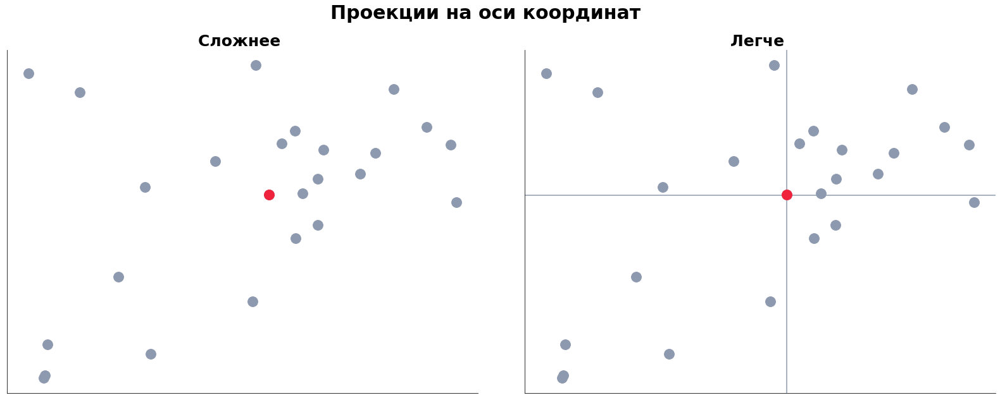

In [93]:
x = [0.95746191, 0.54897903, 0.22076161, 0.13702722, 0.74805263,
       0.29173055, 0.78150446, 0.65586291, 0.06638412, 0.62303504,
       0.06164918, 0.27856213, 0.89254479, 0.8217758 , 0.60659706,
       0.52064142, 0.57633145, 0.02470461, 0.51349687, 0.65517936,
       0.66818852, 0.9458934 , 0.05915504, 0.43243767, 0.60772387]
y = [0.52892259, 0.55144692, 0.30610779, 0.85589936, 0.61394426,
       0.07572432, 0.67511932, 0.59813073, 0.10448175, 0.55471068,
       0.01319353, 0.57367412, 0.75195234, 0.86501862, 0.74208021,
       0.93652803, 0.70445345, 0.91225394, 0.23252521, 0.46134759,
       0.68520687, 0.6997237 , 0.0057934 , 0.65053825, 0.42088492]

fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Проекции на оси координат', fontsize=30, fontweight='bold')

axes[0].scatter(x, y, color='#8D99AE', s=250)
axes[0].scatter(x[1], y[1], color='#EF233C', s=250)
axes[0].set_title('Сложнее ', fontsize=25, fontweight='bold')

axes[1].axvline(x=x[1]+0.0005, color='#8D99AE', zorder=1)
axes[1].axhline(y=y[1]-0.002, color='#8D99AE', zorder=1)
axes[1].scatter(x[:], y[:], color='#8D99AE', s=250)
axes[1].scatter(x[1], y[1], color='#EF233C', s=250, zorder=2)
axes[1].set_title('Легче ', fontsize=25, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

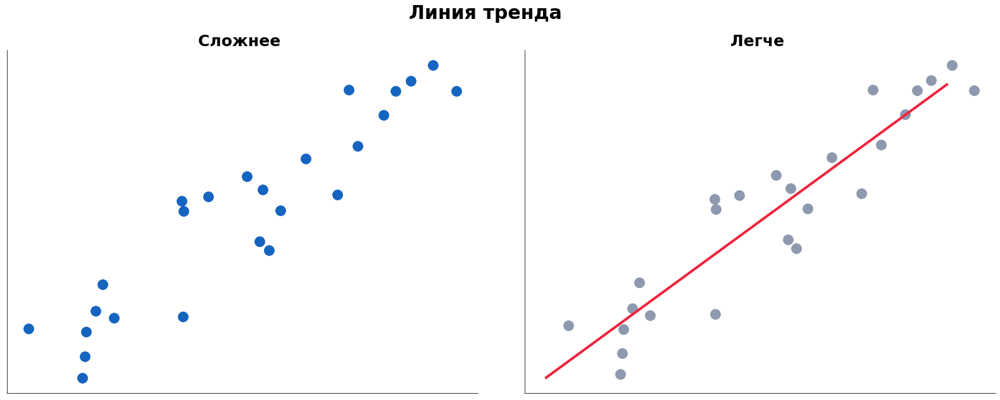

In [94]:
np.random.seed(42)

noise_x = np.random.uniform(0, 0.15, 25)
noise_y = np.random.uniform(0, 0.35, 25)

x = np.linspace(0, 1, 25) + noise_x
y = np.linspace(0, 1, 25) + noise_y

x_line = np.linspace(0, 1, 100)
y_line = x*3

fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Линия тренда', fontsize=30, fontweight='bold')

axes[0].scatter(x, y, color='#1565C0', s=250)
axes[0].set_title('Сложнее ', fontsize=25, fontweight='bold')

axes[1].scatter(x, y, color='#8D99AE', s=250)
axes[1].set_title('Легче ', fontsize=25, fontweight='bold')

z = np.polyfit(x, y, 1)
p = np.poly1d(z)
axes[1].plot(x_line, p(x_line), color='#EF233C', linewidth=4)

for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

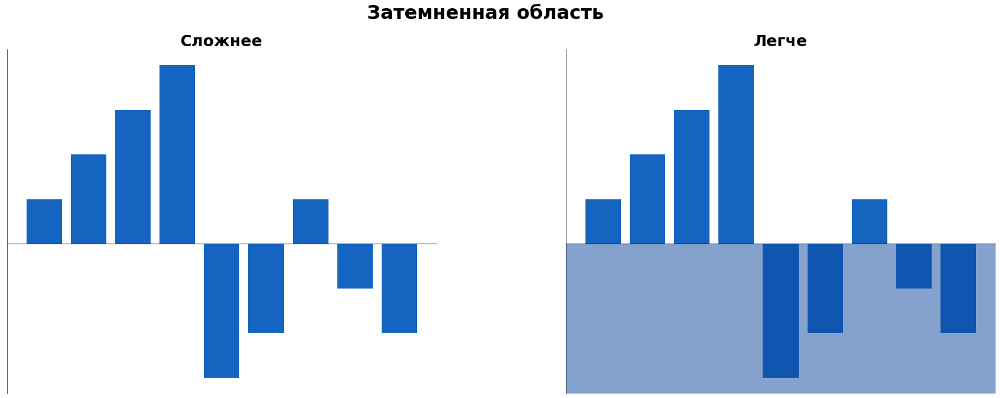

In [95]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.3, 'hspace': 0.1})
fig.suptitle('Затемненная область', fontsize=30, fontweight='bold')

x = np.arange(9)
y = np.array([1, 2, 3, 4, -3, -2, 1, -1, -2])

axes[0].bar(x, y, color='#1565C0')
axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')

axes[1].bar(x, y, color='#1565C0')
axes[1].axhspan(-5, 0, facecolor='#0D47A1', alpha=0.5)

axes[1].set_title('Легче', fontsize=25, fontweight='bold')
axes[1].spines['bottom'].set_position(('data', 0))
axes[1].set_ylim(axes[0].get_ylim())

for ax in axes:
    ax.set(xticks=(), yticks=())
    ax.spines['bottom'].set_position(('data', 0))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

<div style='font-weight: 700; font-size: 50px; text-align: center;'>Форматирование</div>

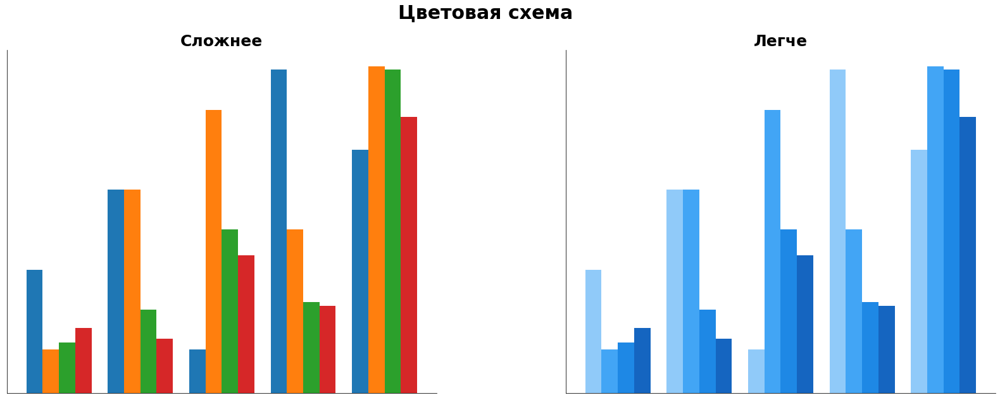

In [98]:
x = np.arange(5)
y1 = [34, 56, 12, 89, 67]
y2 = [12, 56, 78, 45, 90]
y3 = [14, 23, 45, 25, 89]
y4 = [18, 15, 38, 24, 76]
width = 0.2

fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.3, 'hspace': 0.1})
fig.suptitle('Цветовая схема', fontsize=30, fontweight='bold')
  
axes[0].bar(x-0.2, y1, width)
axes[0].bar(x, y2, width)
axes[0].bar(x+0.2, y3, width)
axes[0].bar(x+0.4, y4, width)

axes[1].bar(x-0.2, y1, width, color='#90CAF9')
axes[1].bar(x, y2, width, color='#42A5F5')
axes[1].bar(x+0.2, y3, width, color='#1E88E5')
axes[1].bar(x+0.4, y4, width, color='#1565C0')

for ax in axes:
    ax.set(yticks=(), xticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')
axes[1].set_title('Легче', fontsize=25, fontweight='bold')
    
plt.show()

<div style='font-weight: 700; font-size: 35px; text-align: center;'>Цветовая слепота</div>
<div style='text-align:center;'>
    <img src='https://miro.medium.com/max/2000/1*vEU5WV7Ho3FqQRcL2n5BEw.png'>
    <i>Source: </i> <a src='https://uxdesign.cc/color-blindness-in-user-interfaces-66c27331b858'>Medium</a>
</div>

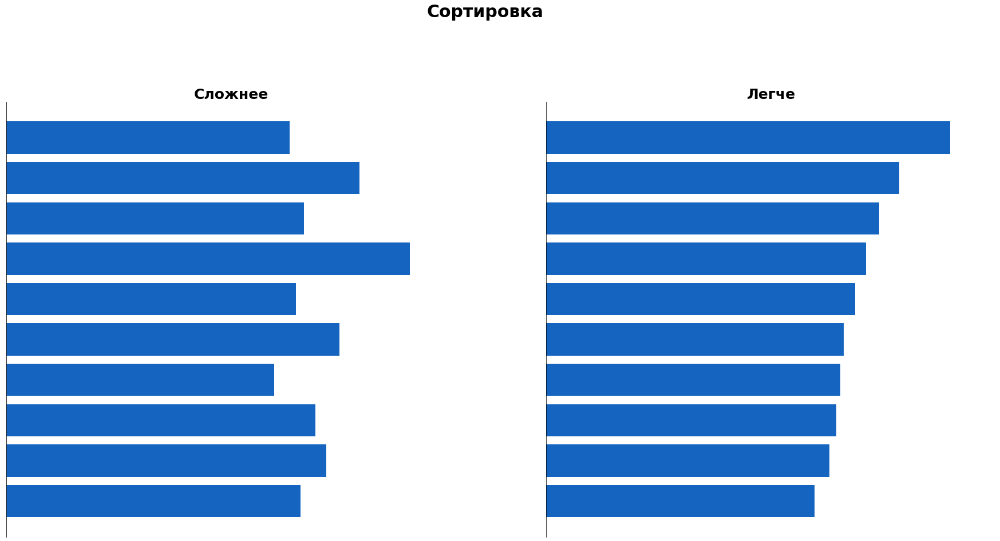

In [99]:
fig, axes = plt.subplots(1, 2, figsize=(31, 14), gridspec_kw={'hspace': 15, 'wspace': 0.2})
fig.suptitle('Сортировка', fontsize=30, fontweight='bold', y=1.05)

amount = [20632, 18045, 17030, 16348, 15803, 15214, 15042, 14811, 14476, 13704]

np.random.seed(42)
np.random.shuffle(amount)

axes[0].barh(np.arange(10, 0, -1), amount, color='#1565C0')
axes[1].barh(np.arange(10, 0, -1), sorted(amount, reverse=True), color='#1565C0')

for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=np.arange(1, 11), ylabel=None, xlim=(0, 23000))
    ax.set_yticks(())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

    
axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')
axes[1].set_title('Легче', fontsize=25, fontweight='bold')

plt.show()

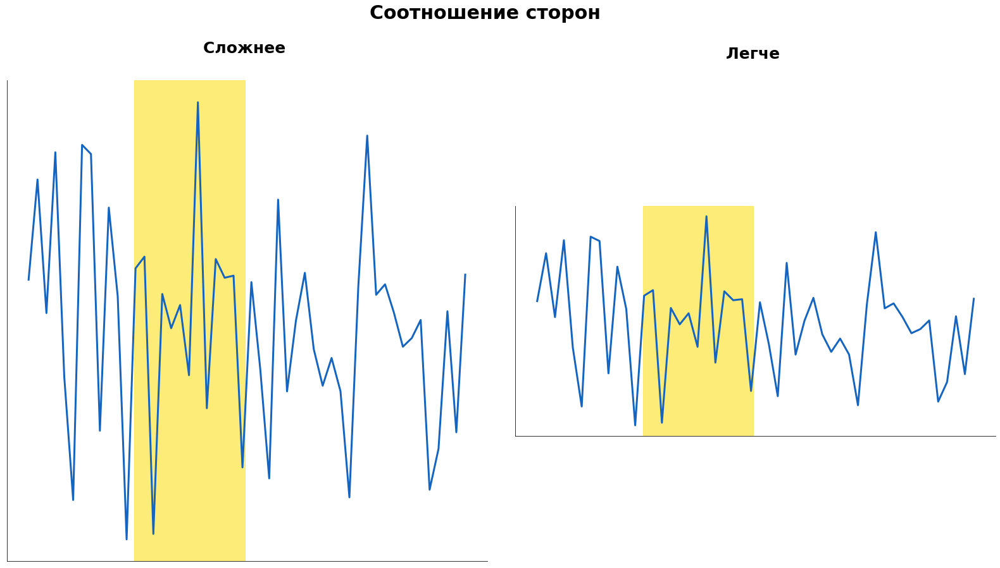

In [100]:
x = np.linspace(1, 100, 50)
y = [ 2.01835064,  3.07279966,  1.66738972,  3.35979451,  0.99806844,
       -0.30009902,  3.43714219,  3.34099243,  0.42937806,  2.77714832,
        1.84405411, -0.71457174,  2.13818856,  2.26075712, -0.65679699,
        1.86808413,  1.5081475 ,  1.75176078,  1.01337825,  3.88583534,
        0.66560426,  2.23566479,  2.03899334,  2.06083311,  0.04293859,
        1.99302534,  1.07381876, -0.07278199,  2.86093069,  0.84292318,
        1.58831617,  2.0909103 ,  1.28768716,  0.90270916,  1.19457605,
        0.84459071, -0.27226942,  1.94741303,  3.53515959,  1.85997856,
        1.96982301,  1.66974964,  1.31301127,  1.40385854,  1.59439098,
       -0.19187131,  0.23823163,  1.68630608,  0.41236004,  2.07169186]

fig = plt.figure(figsize=(28, 14))
fig.suptitle('Соотношение сторон', fontsize=30, fontweight='bold', y=1)

gs = gridspec.GridSpec(4, 6)
ax1 = plt.subplot(gs[:, :3])
ax1.plot(x, y, linewidth=3, color='#1565C0')
ax1.set_title('Сложнее ', fontsize=25, y=1.05, fontweight='bold')
ax1.axvspan(25, 50, color='#FEE440', alpha=0.7)

ax2 = plt.subplot(gs[1:-1, 3:])
ax2.plot(x, y, linewidth=3, color='#1565C0')
ax2.set_title('Легче ', fontsize=25, y=1.625, fontweight='bold')
ax2.axvspan(25, 50, color='#FEE440', alpha=0.7)

for ax in [ax1, ax2]:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


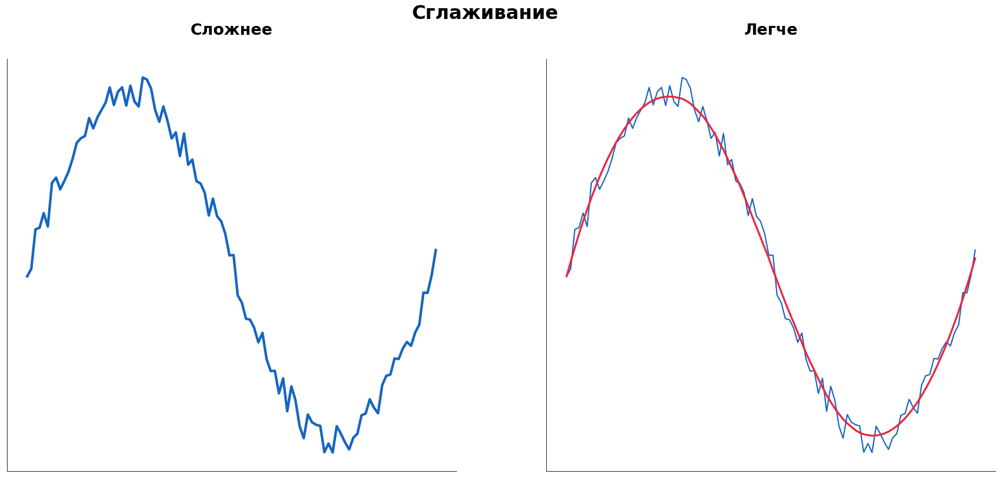

In [101]:
fig, axes = plt.subplots(1, 2, figsize=(28, 12), )
fig.suptitle('Сглаживание', fontsize=30, fontweight='bold')

x = np.linspace(0,2*np.pi,100)
y = np.sin(x) + np.random.random(100) * 0.2

yhat = savgol_filter(y, 51, 3)

axes[0].plot(x,y, linewidth=4, color='#1565C0')
axes[0].set_title('Сложнее', fontsize=25, y=1.05, fontweight='bold')

axes[1].plot(x,y, linewidth=2, color='#1565C0')
axes[1].plot(x,yhat, color='#EF233C', linewidth=3)
axes[1].set_title('Легче', fontsize=25, y=1.05, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), yticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

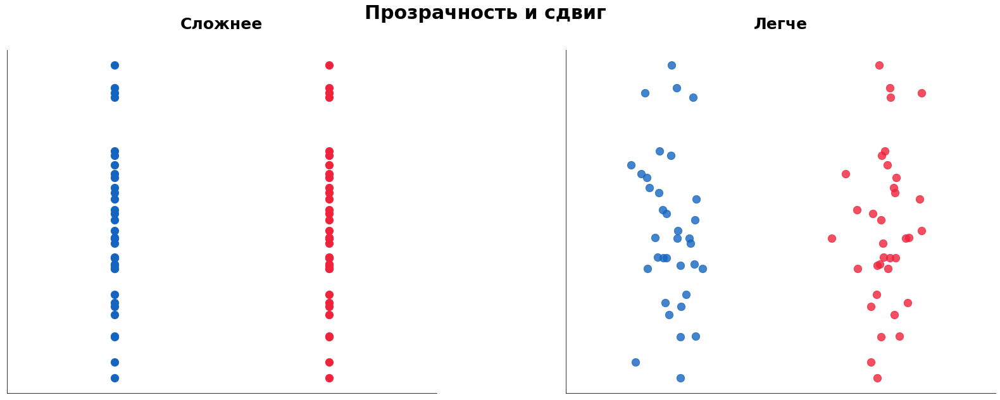

In [102]:
np.random.seed(42)

yA = np.random.randn(35)
xA= np.random.normal(1, 0.1, len(yA))
xB = np.random.normal(2, 0.1, len(yA))

fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.3, 'hspace': 0.1})
fig.suptitle('Прозрачность и сдвиг', fontsize=30, fontweight='bold')

axes[0].scatter(np.zeros(len(yA)), yA, 150, color='#1565C0')
axes[0].scatter(np.ones(len(yA)), yA, 150, color='#EF233C')
axes[0].set_xlim((-0.5, 1.5))
axes[0].set_title('Сложнее', fontsize=25, y=1.05, fontweight='bold')

axes[1].scatter(xA, yA, 150, alpha=0.8, color='#1565C0')
axes[1].scatter(xB, yA, 150, alpha=0.8, color='#EF233C')
axes[1].set_xlim((0.5, 2.5))
axes[1].set_title('Легче', fontsize=25, y=1.05, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), yticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

<div style='font-weight: 700; font-size: 50px; text-align: center;'>Соблюдение стандартов</div>

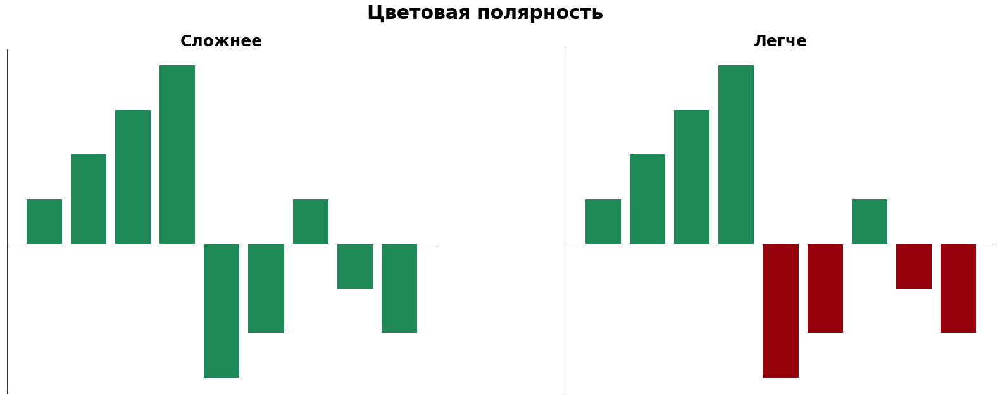

In [103]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.3, 'hspace': 0.1})
fig.suptitle('Цветовая полярность', fontsize=30, fontweight='bold')

x = np.arange(9)
y = np.array([1, 2, 3, 4, -3, -2, 1, -1, -2])

axes[0].bar(x, y, color='#1E8857')
axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')
axes[0].spines['bottom'].set_position(('data', 0))
axes[0].set_xticks(())


axes[1].bar(np.where(y > 0)[0], y[y>0], color='#1E8857')
axes[1].bar(np.where(y < 0)[0], y[y<0], color='#97010B')


axes[1].set_title('Легче', fontsize=25, fontweight='bold')
axes[1].spines['bottom'].set_position(('data', 0))
axes[1].set_xticks(())
axes[1].set_ylim(axes[0].get_ylim())

for ax in axes:
    ax.set(xticks=(), yticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

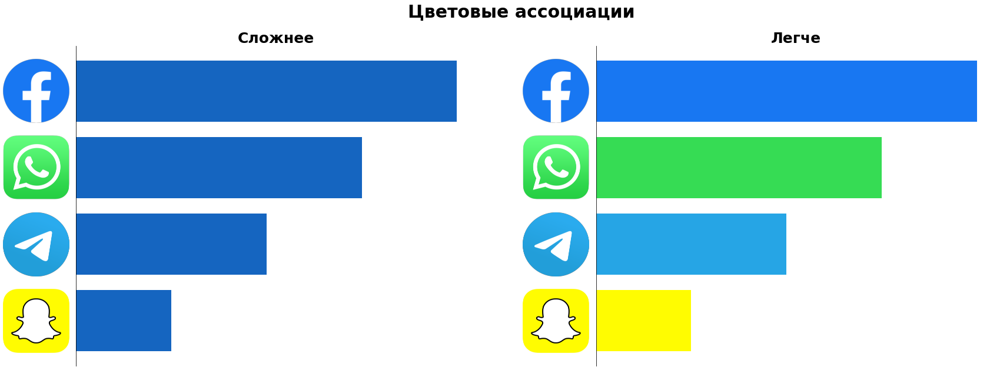

In [104]:
def ins_set(ins):
    ins.spines['left'].set_visible(False)
    ins.spines['right'].set_visible(False)
    ins.spines['bottom'].set_visible(False)
    ins.spines['top'].set_visible(False)
    ins.set(xticks=(), yticks=())

def get_img(url):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    return img
    
facebook = 'https://i.imgur.com/hy2xkUW.png'
whatsapp = 'https://i.imgur.com/sK8GcPF.png'
telegram = 'https://i.imgur.com/sU5GARG.png'
twitter  = 'https://i.imgur.com/LeGVQkm.png'
snapchat = 'https://i.imgur.com/o2YzXuX.png'
    
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.3, 'hspace': 0.1})
fig.suptitle('Цветовые ассоциации', fontsize=30, fontweight='bold')

x = np.arange(4)
y = np.array([1, 2, 3, 4])

axes[0].barh(x, y, color='#1565C0')
axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')

ins = axes[0].inset_axes([-0.2,0.76,0.2,0.2])
ins_set(ins)
imgplot = ins.imshow(get_img(facebook))

ins = axes[0].inset_axes([-0.2,0.52,0.2,0.2])
ins_set(ins)
imgplot = ins.imshow(get_img(whatsapp))

ins = axes[0].inset_axes([-0.2,0.28,0.2,0.2])
ins_set(ins)
imgplot = ins.imshow(get_img(telegram))

ins = axes[0].inset_axes([-0.2,0.04,0.2,0.2])
ins_set(ins)
imgplot = ins.imshow(get_img(snapchat))

axes[1].set_title('Легче', fontsize=25, fontweight='bold')
axes[1].barh(x, y)
axes[1].barh(x[3], y[3], color='#1877f2')
axes[1].barh(x[2], y[2], color='#36dc54')
axes[1].barh(x[1], y[1], color='#26a5e5')
axes[1].barh(x[0], y[0], color='#fffc01')

ins = axes[1].inset_axes([-0.2,0.76,0.2,0.2])
ins_set(ins)
imgplot = ins.imshow(get_img(facebook))

ins = axes[1].inset_axes([-0.2,0.52,0.2,0.2])
ins_set(ins)
imgplot = ins.imshow(get_img(whatsapp))

ins = axes[1].inset_axes([-0.2, 0.28,0.2,0.2])
ins_set(ins)
imgplot = ins.imshow(get_img(telegram))

ins = axes[1].inset_axes([-0.2,0.04, 0.2,0.2])
ins_set(ins)
imgplot = ins.imshow(get_img(snapchat))

for ax in axes:
    ax.set(xticks=(), yticks=())
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

plt.show()

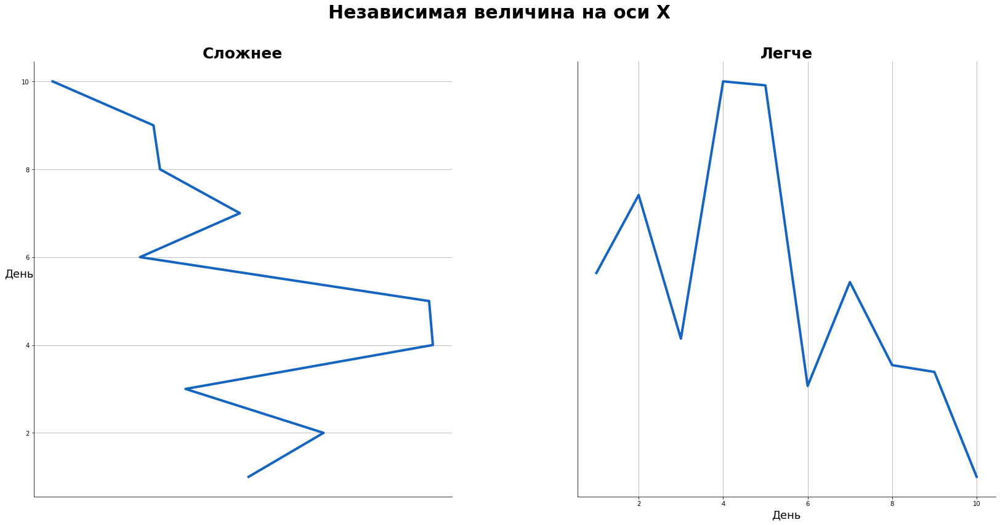

In [105]:
fig, axes = plt.subplots(1, 2, figsize=(28, 13), gridspec_kw={'wspace': 0.3, 'hspace': 0.1})
fig.suptitle('Независимая величина на оси X', fontsize=30, fontweight='bold')

x = np.arange(1, 11)
y = np.random.rand(10)*1000

axes[0].plot(y, x, linewidth=4, color='#1565C0')
axes[1].plot(x, y, linewidth=4, color='#1565C0')

axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')
axes[1].set_title('Легче', fontsize=25, fontweight='bold')

axes[0].set_ylabel('День', fontsize=18, rotation=0)
axes[0].set_xticks(())
axes[0].grid()
axes[1].set_xlabel('День', fontsize=18)
axes[1].set_yticks(())
axes[1].grid()

for ax in axes:
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

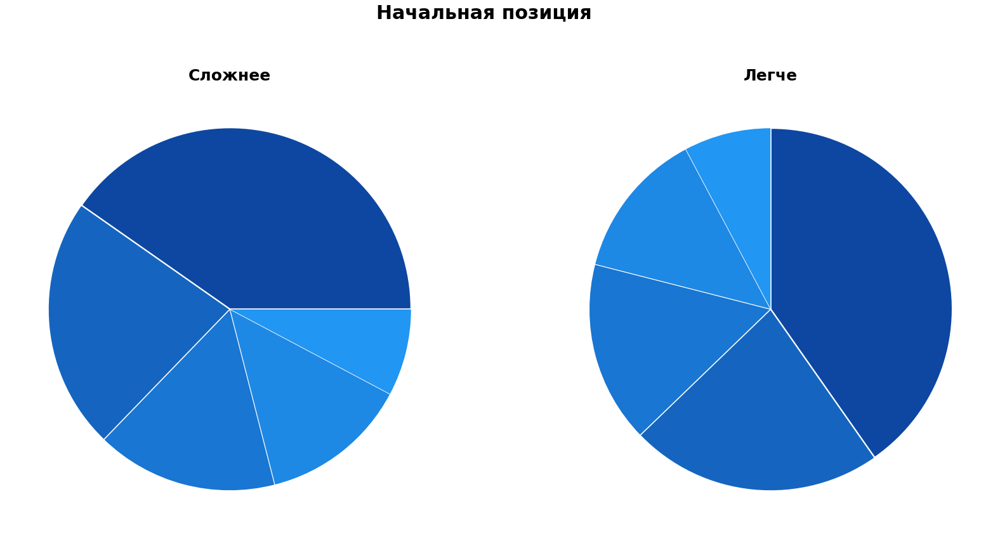

In [106]:
sizes = [58.99, 32.96, 23.74, 19.41, 11.37]
colors=['#0d47a1', '#1565c0', '#1976d2', '#1e88e5', '#2196f3']
colors1=colors[-1::-1]
explode = (0.005, 0.005, 0.005, 0.005, 0.005)

fig, axes = plt.subplots(1, 2, figsize=(28, 14))
axes[0].pie(sizes, explode=explode, colors=colors)
axes[0].set_title('Сложнее', fontsize=25, fontweight='bold')
axes[1].pie(sorted(sizes), explode=explode, colors=colors1, startangle=90)
axes[1].set_title('Легче', fontsize=25, fontweight='bold')


fig.suptitle('Начальная позиция', fontsize=30, fontweight='bold')
plt.show()

<div style='font-weight: 700; font-size: 40px; text-align: center;'>Lie Factor</div>
<br>
<div>
    <span style='font-size: 25px'>$$Lie \: Factor = \frac{size \: of \: effect \: shown \: in \: graphic}{size \: of \: effect \: in \: data}$$</span>
    <br>
    <span style='font-size: 25px'>$$size \: of \: effect = \frac{|second \: value - first \: value|}{first \: value}$$</span>
    <br>
    <span style='font-size: 25px'>$$0.95 < Lie \: Factor < 1.05$$</span>
</div>

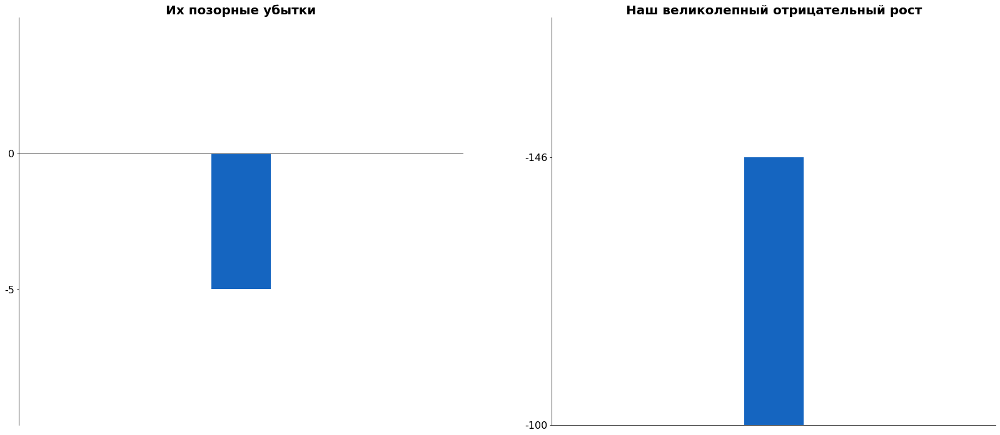

In [10]:
figure, axes = plt.subplots(1, 2, figsize=(28, 12))

axes[0].bar([3], [-5], color='#1565C0')
axes[0].set_xlim((0, 6))
axes[0].set_ylim((-10, 5))
axes[0].spines['bottom'].set_position(('data', 0))
axes[0].set_yticks((0, -5))
axes[0].set_yticklabels((0, -5), fontsize=16)
axes[0].set_title('Их позорные убытки', fontsize=20, fontweight='bold')

axes[1].bar([3], [-146], color='#1565C0')
axes[1].set_xlim((0, 6))
axes[1].set_ylim((-100, -170))
axes[1].spines['bottom'].set_position(('data', -100))
axes[1].set_yticks((-146, -100))
axes[1].set_yticklabels(( -146, -100), fontsize=16)

axes[1].set_title('Наш великолепный отрицательный рост', fontsize=20, fontweight='bold')

for ax in axes:
    ax.set(xticks=())
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
plt.show()

<div style='font-size: 20px'>
    <br>
    $$size \: of \: effect \: in \: data = \frac{|-5+146|}{-146}=-28.2$$
    <br>
    $$size \: of \: effect \: shown \: in \: graphic = \frac{|-4 - 8.5|}{-4} = -3.125$$
    <br>
    $$Lie \: factor = \frac{-3.125}{-28.2}=0.11$$
    <br>
    $$\ln{0.11} \cdot 100 = -220\%$$
</div>

<div style='font-weight: 700; font-size: 50px; text-align: center;'>Избегать заблуждений</div>

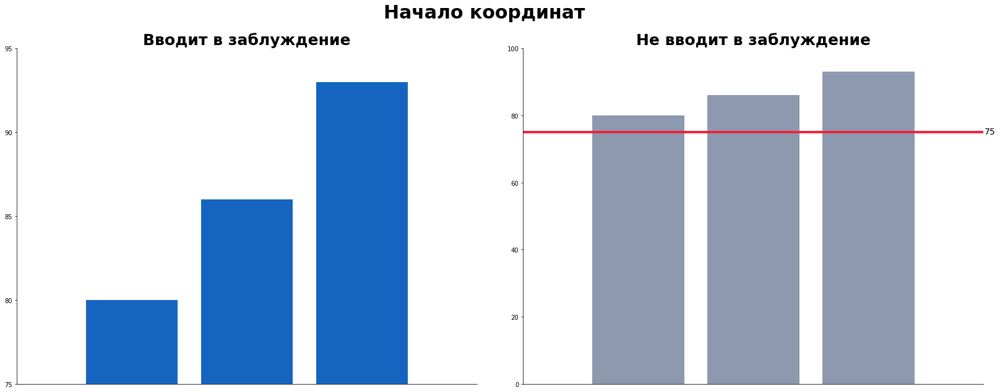

In [107]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Начало координат', fontsize=30, fontweight='bold')

x = np.arange(1, 4)
y = [80, 86, 93]

axes[0].bar(x, y, color='#1565C0')
axes[0].set_xlim((0, 4))
axes[0].set_ylim((75, 95))
axes[0].set_yticks((75, 80, 85, 90, 95))
axes[0].set_title('Вводит в заблуждение', fontsize=25, fontweight='bold')

axes[1].bar(x, y, color='#8D99AE')
axes[1].axhline(75, linewidth=4, color='#EF233C')
axes[1].set_ylim((0, 100))
axes[1].set_xlim((0, 4))
axes[1].set_title('Не вводит в заблуждение', fontsize=25, fontweight='bold')
axes[1].text(axes[1].get_xlim()[1]+0.01, 74.5, '75', fontsize=14)

for ax in axes:
    ax.set(xticks=(), xlabel=None, ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

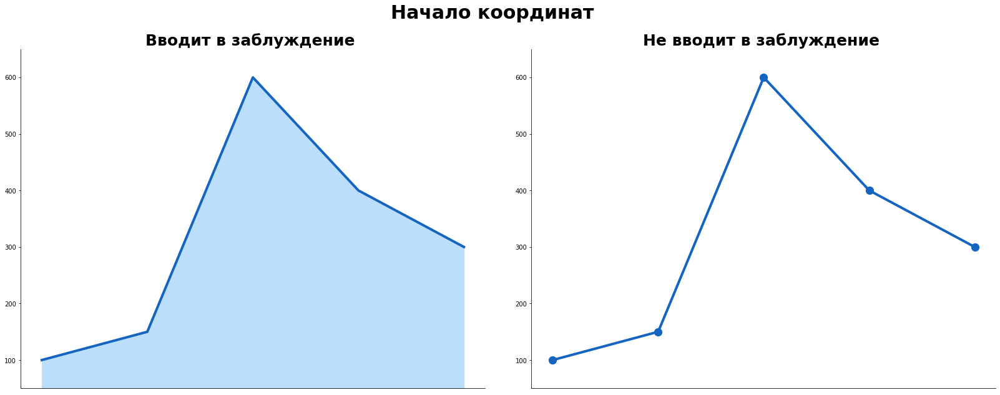

In [108]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Начало координат', fontsize=30, fontweight='bold')

x = np.arange(1, 6)
y = [100, 150, 600, 400, 300]

axes[0].plot(x, y, color='#1565C0', linewidth=4)
axes[0].fill_between(x, y, color='#BBDEFB')
axes[0].set_title('Вводит в заблуждение ', fontsize=25, fontweight='bold')

axes[1].plot(x, y, color='#1565C0', linewidth=4)
axes[1].scatter(x, y, 150, color='#1565C0')
axes[1].set_title('Не вводит в заблуждение ', fontsize=25, fontweight='bold')

for ax in axes:
    ax.set(xticks=(), xlabel=None, ylabel=None, ylim=(50, 650))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

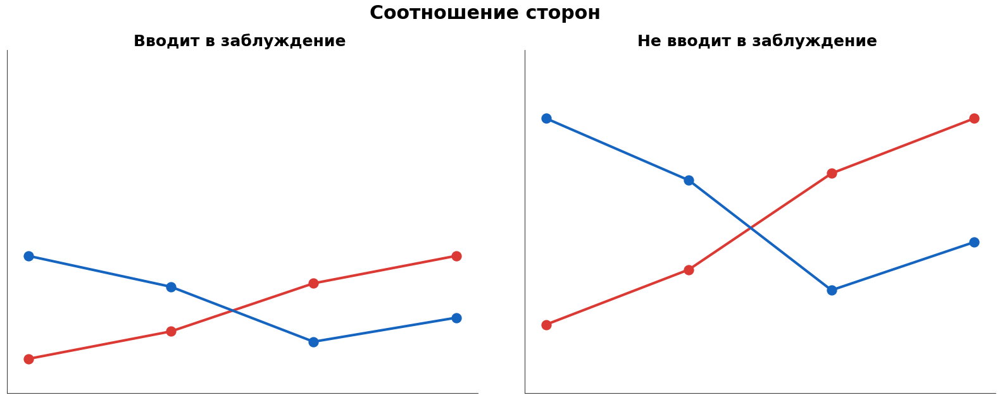

In [109]:
fig, axes = plt.subplots(1, 2, figsize=(28, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Соотношение сторон', fontsize=30, fontweight='bold')

x = np.arange(1, 5)
y1 = [10, 18, 32, 40]
y2 = [40, 31, 15, 22]

axes[0].plot(x, y1, linewidth=4, color='#DB3A34')
axes[0].scatter(x, y1, 150, linewidth=4, color='#DB3A34')
axes[0].plot(x, y2, linewidth=4, color='#1565C0')
axes[0].scatter(x, y2, 150, linewidth=4, color='#1565C0')
axes[0].set_title('Вводит в заблуждение ', fontsize=25, fontweight='bold')
axes[0].set_ylim((0, 100))

axes[1].plot(x, y1, linewidth=4, color='#DB3A34')
axes[1].scatter(x, y1, 150, linewidth=4, color='#DB3A34')
axes[1].plot(x, y2, linewidth=4, color='#1565C0')
axes[1].scatter(x, y2, 150, linewidth=4, color='#1565C0')
axes[1].set_title('Не вводит в заблуждение ', fontsize=25, fontweight='bold')
axes[1].set_ylim((0, 50))

for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

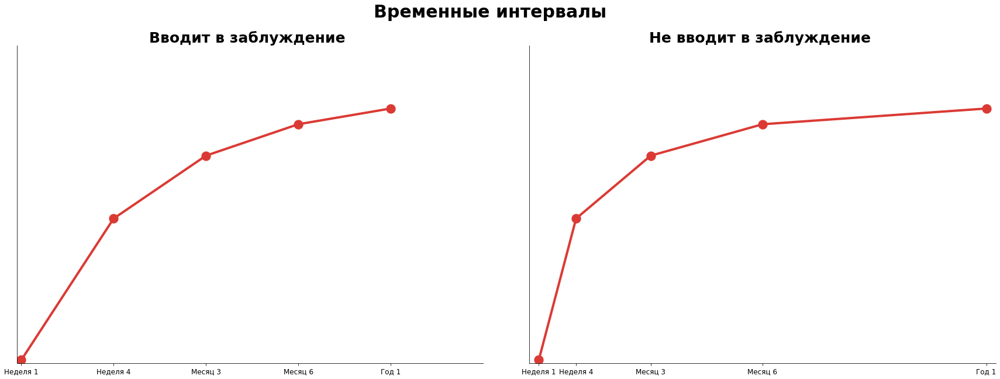

In [110]:
fig, axes = plt.subplots(1, 2, figsize=(30, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Временные интервалы', fontsize=30, fontweight='bold')

x1 = np.arange(0, 5)
x2 = [0, 4, 12, 24, 48]
y = [0, 45, 65, 75, 80]

axes[0].plot(x1, y, linewidth=4, color='#DB3A34', zorder=99)
axes[0].scatter(x1, y, 150, linewidth=4, color='#DB3A34')
axes[0].set_title('Вводит в заблуждение ', fontsize=25, fontweight='bold')
axes[0].set_xticks((0, 1, 2, 3, 4))
axes[0].set_xticklabels(('Неделя 1', 'Неделя 4', 'Месяц 3', 'Месяц 6', 'Год 1'), fontsize=12)
axes[0].set_xlim((-0.05, 5))
axes[0].set_ylim((-1, 100))

axes[1].plot(x2, y, linewidth=4, color='#DB3A34', zorder=99)
axes[1].scatter(x2, y, 150, linewidth=4, color='#DB3A34')
axes[1].set_title('Не вводит в заблуждение ', fontsize=25, fontweight='bold')
axes[1].set_xticks((0, 4, 12, 24, 48))
axes[1].set_xticklabels(('Неделя 1', 'Неделя 4', 'Месяц 3', 'Месяц 6', 'Год 1'), fontsize=12)
axes[1].set_ylim((-1, 100))
axes[1].set_xlim((-1, 49))

for ax in axes:
    ax.set(yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

plt.show()

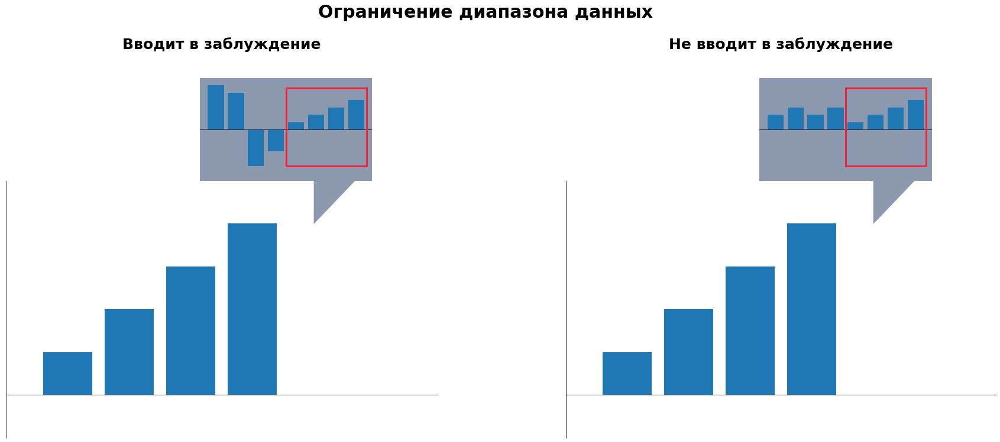

In [111]:
def ins_set(ins):
    ins.set_facecolor('#8D99AE')
    ins.set_ylim((-7, 7))
    ins.set(xticks=(), yticks=())
    for spine in ins.spines.values():
        spine.set_visible(False)
    ins.axhline(0, 0, 1, color='#2B2D42', linewidth=1)
    ins.axhline(-5, 0.5, 0.96, color='#EF233C', linewidth=3)
    ins.axhline(5.6, 0.5, 0.96, color='#EF233C', linewidth=3)
    ins.axvline(3.5, 0.1465, 0.9, color='#EF233C', linewidth=3)
    ins.axvline(7.5, 0.1465, 0.9, color='#EF233C', linewidth=3)
    

fig, axes = plt.subplots(1, 2, figsize=(30, 8), gridspec_kw={'wspace': 0.3, 'hspace': 0.1})
fig.suptitle('Ограничение диапазона данных', fontsize=30, y=1.4, fontweight='bold')

x = np.arange(4)
y = np.array([1, 2, 3, 4])

x1 = np.arange(8)
y1 = [6, 5, -5, -3, 1, 2, 3, 4]
y2 = [2, 3, 2, 3, 1, 2, 3, 4]
pts = np.array([[4, 10], [8, 10], [4, 4]])

p = Polygon(pts, closed=False, color='#8D99AE')
axes[0].add_patch(p)
axes[0].bar(x, y)
axes[0].set_title('Вводит в заблуждение', fontsize=25, y=1.5, fontweight='bold')
axes[0].set_xlim((-1, 6))

ins = axes[0].inset_axes([0.45,1,0.4,0.4])
ins.bar(x1,y1)
ins_set(ins)

p1 = Polygon(pts, closed=False, color='#8D99AE')
axes[1].add_patch(p1)
axes[1].set_title('Не вводит в заблуждение', fontsize=25, y=1.5, fontweight='bold')
axes[1].bar(x, y)
axes[1].set_xlim((-1, 6))

ins = axes[1].inset_axes([0.45,1,0.4,0.4])
ins.bar(x1, y2)
ins_set(ins)

for ax in axes:
    ax.set(xticks=(), yticks=(), ylim=(-1, 5))
    ax.spines['bottom'].set_position(('data', 0))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
plt.show()

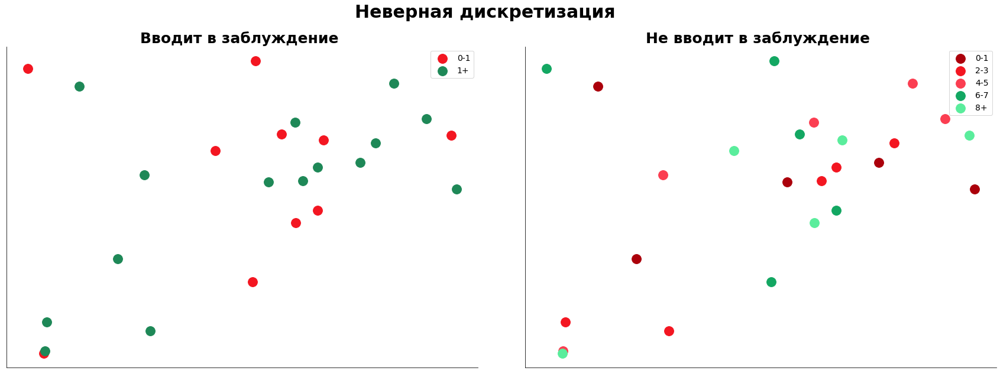

In [112]:
x = [0.95746191, 0.54897903, 0.22076161, 0.13702722, 0.74805263,
       0.29173055, 0.78150446, 0.65586291, 0.06638412, 0.62303504,
       0.06164918, 0.27856213, 0.89254479, 0.8217758 , 0.60659706,
       0.52064142, 0.57633145, 0.02470461, 0.51349687, 0.65517936,
       0.66818852, 0.9458934 , 0.05915504, 0.43243767, 0.60772387]
y = [0.52892259, 0.55144692, 0.30610779, 0.85589936, 0.61394426,
       0.07572432, 0.67511932, 0.59813073, 0.10448175, 0.55471068,
       0.01319353, 0.57367412, 0.75195234, 0.86501862, 0.74208021,
       0.93652803, 0.70445345, 0.91225394, 0.23252521, 0.46134759,
       0.68520687, 0.6997237 , 0.0057934 , 0.65053825, 0.42088492]

fig, axes = plt.subplots(1, 2, figsize=(30, 10), gridspec_kw={'wspace': 0.1, 'hspace': 0.1})
fig.suptitle('Неверная дискретизация', fontsize=30, fontweight='bold')

axes[0].scatter(x[15:], y[15:], color='#F31621', s=250)
axes[0].scatter(x[:15], y[:15], color='#1E8857', s=250)
axes[0].set_title('Вводит в заблуждение ', fontsize=25, fontweight='bold')
axes[0].legend(['0-1', '1+'], fontsize=14)

axes[1].scatter(x[:5], y[:5], color='#AB000B', s=250)
axes[1].scatter(x[5:10], y[5:10], color='#F31621', s=250)
axes[1].scatter(x[10:15], y[10:15], color='#FB3E51', s=250)
axes[1].scatter(x[15:20], y[15:20], color='#13A762', s=250)
axes[1].scatter(x[20:25], y[20:25], color='#5AED9C', s=250)
axes[1].legend(['0-1', '2-3', '4-5', '6-7', '8+'], fontsize=14)

axes[1].set_title('Не вводит в заблуждение ', fontsize=25, fontweight='bold')


for ax in axes:
    ax.set(xticks=(), xlabel=None, yticks=(), ylabel=None)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


<div style='font-weight: 700; font-size: 35px; text-align: center;'>Ошибочные пропорции</div>
<div style='text-align: center'>
    <img src='https://i.imgur.com/BBKtP2s.jpg', style='width: 1600px'>
    <br>
    <span style='display: block; margin: 0 auto; text-align: center; font-size: 20px;'><i>Source: </i>The Visual Display of Quantitative Information</span>
</div>

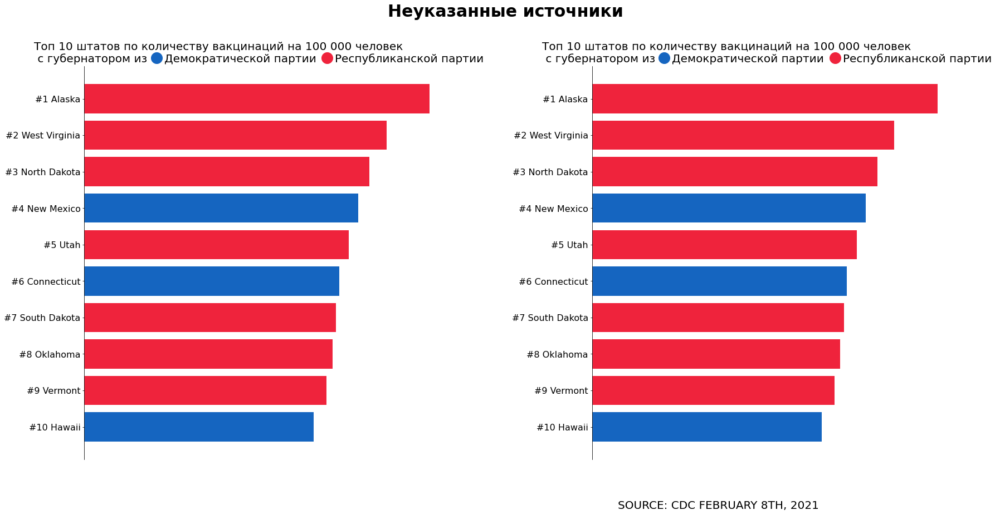

In [115]:
fig, axes = plt.subplots(1, 2, figsize=(28, 13), gridspec_kw={'hspace': 15, 'wspace': 0.4})
fig.suptitle('Неуказанные источники', fontsize=30, fontweight='bold', y=1)

amount_blue = [16348, 15214, 13704]
amount_red = [20632, 18045, 17030, 15803, 15042, 14811, 14476]

states = ['Alaska', 'West Virginia', 'North Dakota', 'New Mexico', 'Utah', 'Connecticut', 'South Dakota', 'Oklahoma', 'Vermont', 'Hawaii']

for ax in axes:
    hbars = ax.barh([7, 5, 1], amount_blue, color='#1565C0')
    #ax.bar_label(hbars, fmt='%.0f', fontsize=16, color='#2B2D42')

    hbars = ax.barh([10, 9, 8, 6, 4, 3, 2], amount_red, color='#EF233C')
    #ax.bar_label(hbars, fmt='%.0f', fontsize=16, color='#2B2D42')
    ax.set(xticks=(), xlabel=None, yticks=np.arange(1, 11), ylabel=None)
    ax.set_yticklabels(['#' + str(i) +' '+ j for i,j in zip(sorted(np.arange(1, 11), reverse=True), states[-1::-1])], fontsize=16)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    
from matplotlib.lines import Line2D    
line1 = Line2D([], [], color='#1565C0', marker='o', linestyle='None', markersize=20, label='Демократической партии')
line2 = Line2D([], [], color='#EF233C', marker='o', linestyle='None', markersize=20, label='Республиканской партии')

axes[0].legend(handles=[line1, line2], bbox_to_anchor=(0.14, 0.98), numpoints=1, fontsize=20, framealpha=0.0, ncol=2, handletextpad=-0.3, columnspacing=0)

axes[0].text(0, 12, '', fontsize=25)
axes[0].text(-3000, 11, 'Топ 10 штатов по количеству вакцинаций на 100 000 человек\n с губернатором из ', fontsize=20)

axes[1].text(-3000, 11, 'Топ 10 штатов по количеству вакцинаций на 100 000 человек\n с губернатором из ', fontsize=20)
axes[1].legend(handles=[line1, line2], fontsize=20, bbox_to_anchor=(0.14, 0.98), framealpha=0.0, ncol=2, handletextpad=-0.3, columnspacing=0)
axes[1].text(0, 12, '', fontsize=25)


fig.text(0.6, 0.03, 'SOURCE: CDC FEBRUARY 8TH, 2021', fontsize=20)
plt.show()

<div style='font-weight: 700; font-size: 50px; text-align: center;'>Библиотеки</div>
<img src='https://rougier.github.io/python-visualization-landscape/landscape-colors.png', style='width: 1600px'>

<div style='font-weight: 700; font-size: 35px; text-align: center;'>Matplotlib</div>

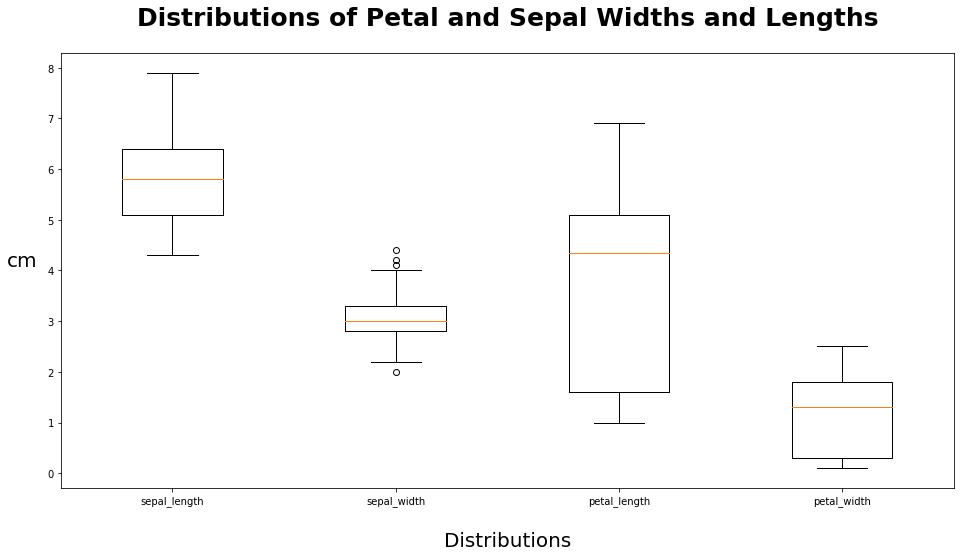

In [119]:
import matplotlib.pyplot as plt

iris = sns.load_dataset('iris')
subset = iris.drop('species', axis=1)

fig, ax = plt.subplots(figsize=(16, 8))
ax.boxplot(subset)

ax.set_title('Distributions of Petal and Sepal Widths and Lengths', fontsize=25, fontweight='bold', y=1.05)
ax.set_xlabel('Distributions', fontsize=20, labelpad=25)
ax.set_ylabel('cm', fontsize=20, rotation=0, labelpad=25)
ax.set_xticks(np.arange(1, 5))
ax.set_xticklabels(subset.columns)

#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)

plt.show()

<div style='font-weight: 700; font-size: 35px; text-align: center;'>Seaborn</div>

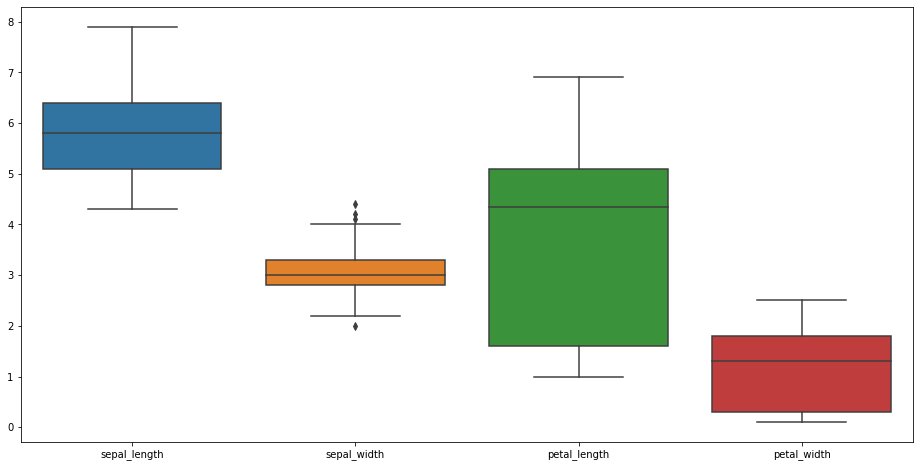

In [135]:
import seaborn as sns

fig = plt.figure(figsize=(16, 8))
sns.boxplot(data=iris)
plt.show()

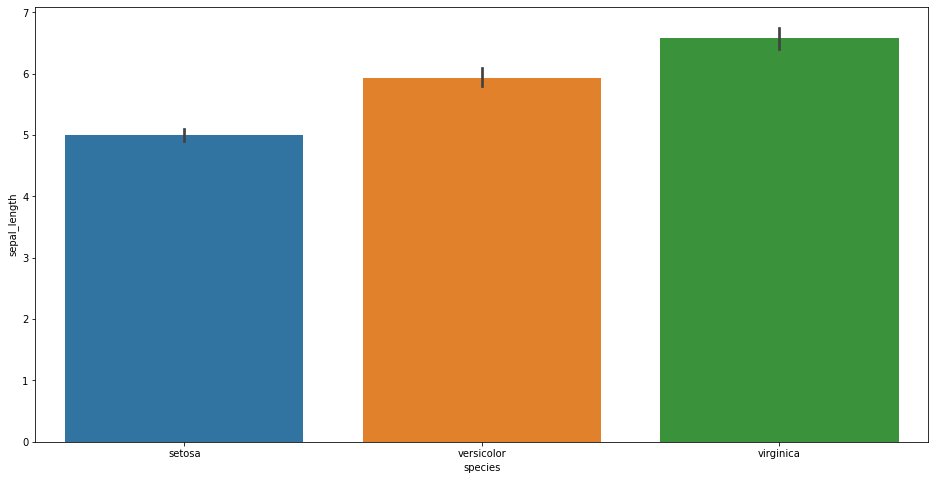

In [136]:
fig = plt.figure(figsize=(16, 8))
sns.barplot(x='species', y='sepal_length', data=iris)
plt.show()

<div style='font-weight: 700; font-size: 35px; text-align: center;'>Pandas</div>

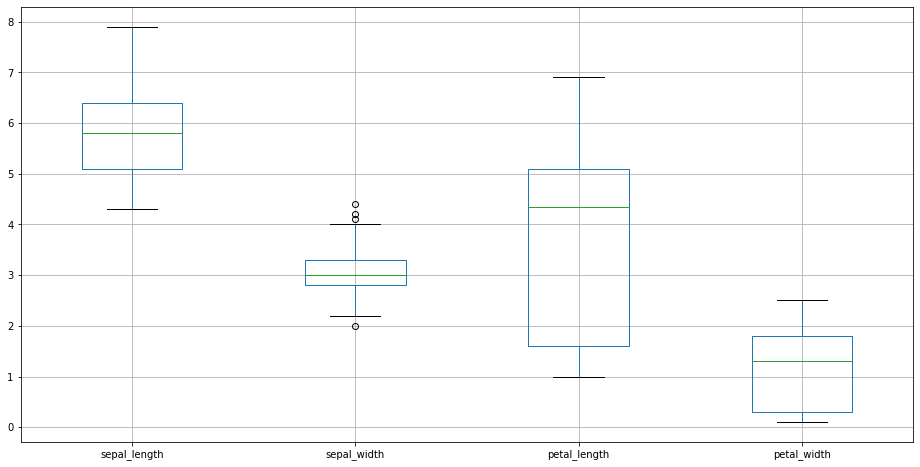

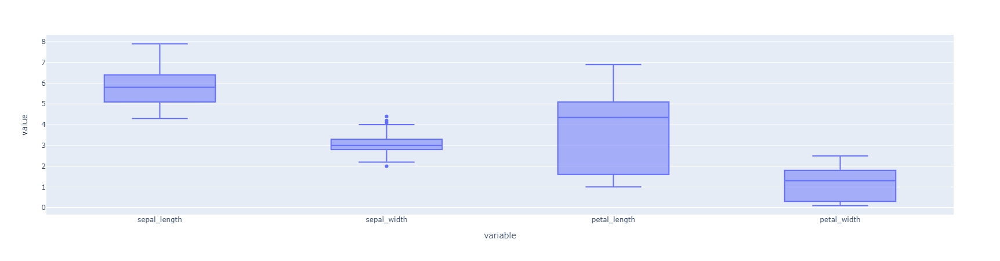

In [137]:
import pandas as pd
import matplotlib
import plotly

pd.options.plotting.backend = 'matplotlib'
fig = plt.figure(figsize=(16, 8))
iris.boxplot()
plt.show()

pd.options.plotting.backend = 'plotly'
fig = iris.drop('species', axis=1).boxplot()
fig.show()

<div style='font-weight: 700; font-size: 35px; text-align: center;'>plotly</div>

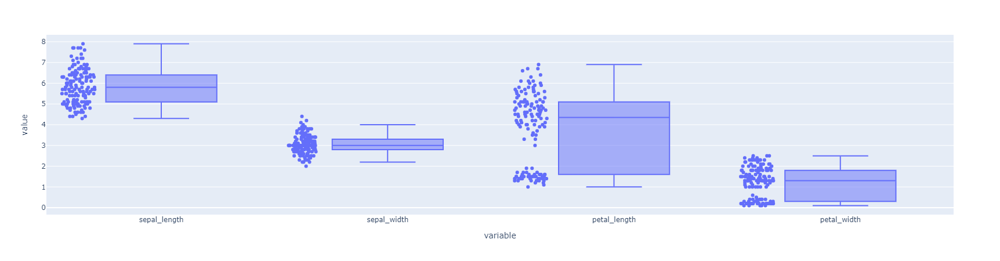

In [138]:
import plotly.express as px

df = px.data.tips()
fig = px.box(iris.drop('species', axis=1), points='all')
fig.write_html('output.html')
fig.show()

In [139]:
from IPython.display import IFrame

IFrame(src='output.html', width=1600, height=600)

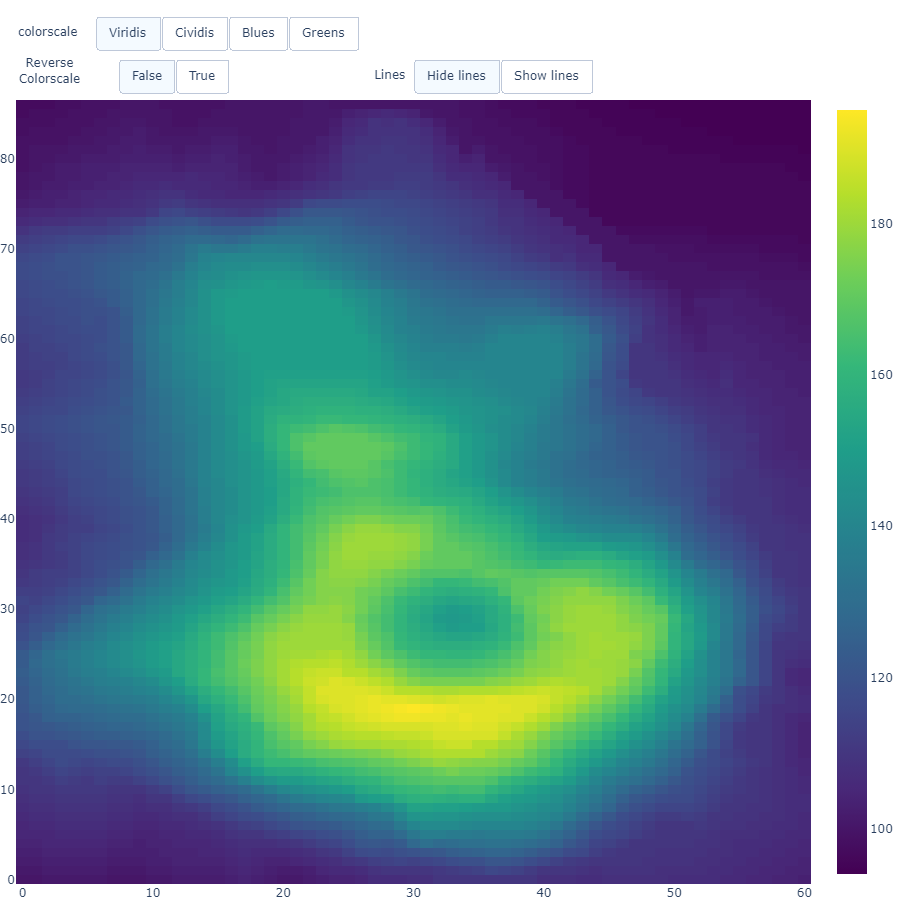

In [140]:
import plotly.graph_objects as go

import pandas as pd

# load dataset
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/volcano.csv")

# Create figure
fig = go.Figure()

# Add surface trace
fig.add_trace(go.Heatmap(z=df.values.tolist(), colorscale="Viridis"))

# Update plot sizing
fig.update_layout(
    width=800,
    height=900,
    autosize=False,
    margin=dict(t=100, b=0, l=0, r=0),
)

# Update 3D scene options
fig.update_scenes(
    aspectratio=dict(x=1, y=1, z=0.7),
    aspectmode="manual"
)

# Add drowdowns
# button_layer_1_height = 1.08
button_layer_1_height = 1.12
button_layer_2_height = 1.065

fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["colorscale", "Viridis"],
                    label="Viridis",
                    method="restyle"
                ),
                dict(
                    args=["colorscale", "Cividis"],
                    label="Cividis",
                    method="restyle"
                ),
                dict(
                    args=["colorscale", "Blues"],
                    label="Blues",
                    method="restyle"
                ),
                dict(
                    args=["colorscale", "Greens"],
                    label="Greens",
                    method="restyle"
                ),
            ]),
            type = "buttons",
            direction="right",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.1,
            xanchor="left",
            y=button_layer_1_height,
            yanchor="top"
        ),
        dict(
            buttons=list([
                dict(
                    args=["reversescale", False],
                    label="False",
                    method="restyle"
                ),
                dict(
                    args=["reversescale", True],
                    label="True",
                    method="restyle"
                )
            ]),
            type = "buttons",
            direction="right",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.13,
            xanchor="left",
            y=button_layer_2_height,
            yanchor="top"
        ),
        dict(
            buttons=list([
                dict(
                    args=[{"contours.showlines": False, "type": "contour"}],
                    label="Hide lines",
                    method="restyle"
                ),
                dict(
                    args=[{"contours.showlines": True, "type": "contour"}],
                    label="Show lines",
                    method="restyle"
                ),
            ]),
            type = "buttons",
            direction="right",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.5,
            xanchor="left",
            y=button_layer_2_height,
            yanchor="top"
        ),
    ]
)

fig.update_layout(
    annotations=[
        dict(text="colorscale", x=0, xref="paper", y=1.1, yref="paper",
                             align="left", showarrow=False),
        dict(text="Reverse<br>Colorscale", x=0, xref="paper", y=1.06,
                             yref="paper", showarrow=False),
        dict(text="Lines", x=0.47, xref="paper", y=1.045, yref="paper",
                             showarrow=False)
    ])

fig.show()

<div style='font-weight: 700; font-size: 35px; text-align: center;'>ggplot</div>

In [144]:
!pip install plotnine

     |████████████████████████████████| 4.7 MB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 231 kB 13.0 MB/s eta 0:00:01
     |████████████████████████████████| 63 kB 2.8 MB/s  eta 0:00:01
     |████████████████████████████████| 9.4 MB 10.3 MB/s eta 0:00:01
     |████████████████████████████████| 111 kB 10.3 MB/s eta 0:00:01


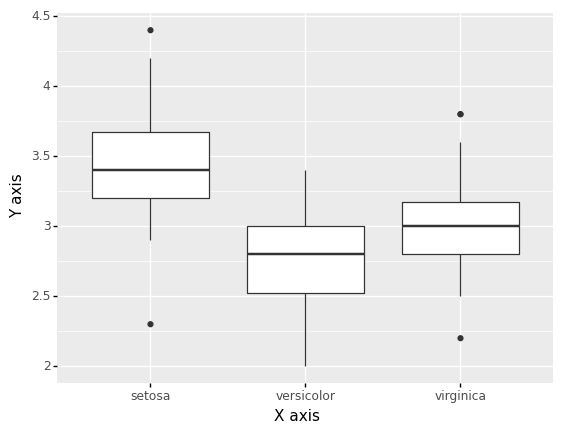

<ggplot: (8735324444546)>

In [145]:
from plotnine import ggplot, geom_boxplot, aes, xlab, ylab, ggtitle

plot = (
    ggplot(iris,  aes('species', 'sepal_width')) \
    + geom_boxplot() \
    + xlab('X axis') \
    + ylab('Y axis')
)
plot

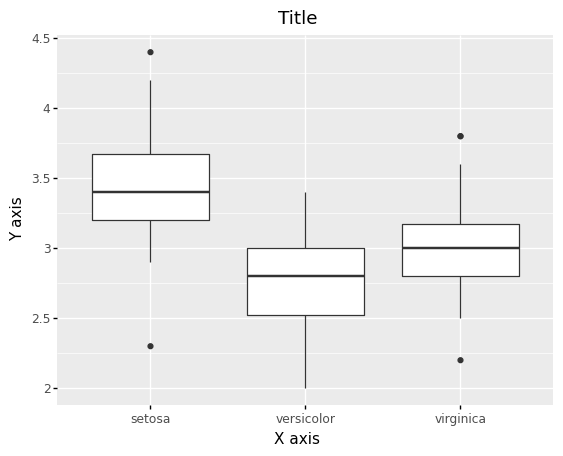

<ggplot: (8735357439805)>

In [146]:
plot + ggtitle('Title')

# Источники
## [1] TUFTE, Edward R. _The visual display of quantitive information_. Graphics Press, 2009.
## [2] DYKES, Brent. _Effective data storytelling: How to drive change with data, narrative, and visuals_. Hoboken, NJ : Wiley, 2020.
## [3] CAIRO, Alberto. _The functional ART: An introduction to information graphics and visualization_. Berkeley, CA : New Riders, 2013.
## [4] KIRK, ANDY. _Data visualisation: A handbook for data driven design_. SAGE PUBLICATIONS, 2019.
## [5] О визуализации данных. Продолжение. _dev.by_ [online]. 26 June 2021. [Accessed 21 September 2021]. Available from: https://dev.by/news/o-vizualizatsii-dannyh-prodolzhenie
## [6] Anscombe's quartet. _Wikipedia_ [online]. 28 August 2021. [Accessed 21 September 2021]. Available from: https://en.wikipedia.org/wiki/Anscombe's_quartet
## [7] Misleading graph. _Wikipedia_ [online]. 23 June 2021. [Accessed 21 September 2021]. Available from: https://en.wikipedia.org/wiki/Misleading_graph
## [8] Kühlschifffahrt. _Wikipedia_ [online]. 28 November 2020. [Accessed 21 September 2021]. Available from: https://de.wikipedia.org/wiki/K%C3%BChlschifffahrt
## [9] Visualization with python¶. _Matplotlib_ [online]. [Accessed 21 September 2021]. Available from: https://matplotlib.org/
## [10] Plotly Python graphing library. _Plotly_ [online]. [Accessed 21 September 2021]. Available from: https://plotly.com/python/
## [11] Statistical data visualization¶. _Seaborn_ [online]. [Accessed 21 September 2021]. Available from: https://seaborn.pydata.org/
## [12] _Pandas_ [online]. [Accessed 21 September 2021]. Available from: https://pandas.pydata.org/
## [13] The data Visualisation catalogue. _The Data Visualisation Catalogue_ [online]. [Accessed 21 September 2021]. Available from: https://datavizcatalogue.com/